# Introduction to dataset

This dataset consists of two distinct image collections: Claude Monet's impressionist paintings and standard photographs that depict similar landscape themes. The collection includes approximately 300 Monet paintings and over 7,000 photographs, revealing a significant class imbalance that presents both challenges and opportunities for machine learning applications. The Monet paintings showcase the artist's distinctive impressionist style, characterized by visible brushstrokes, emphasis on light, and subtle color variations that capture the changing qualities of nature. The photographs, on the other hand, represent realistic depictions of similar scenes—gardens, water features, landscapes, and natural settings.

This dataset was compiled specifically for generative adversarial network (GAN) training, with the primary goal of teaching AI models to transform ordinary photographs into images that mimic Monet's unique artistic style. The substantial imbalance between the two classes necessitates careful consideration during model training, including data augmentation strategies for the smaller Monet class. This collection serves as an excellent resource for researchers and developers interested in style transfer, computer vision, and creative AI applications.

In [ ]:
# Import necessary libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2
import random
import tensorflow as tf
from pathlib import Path
from tqdm import tqdm
import shutil
from IPython.display import clear_output
import glob
import time

# For cleaner plotting
%matplotlib inline

# Set random seeds for reproducibility
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

# Display image outputs larger
from IPython.display import display
plt.rcParams['figure.figsize'] = [12, 8]

In [2]:
DATA_DIR = os.getcwd()
MONET_DIR = os.path.join(DATA_DIR, 'data/monet_jpg')
PHOTO_DIR = os.path.join(DATA_DIR, 'data/photo_jpg')

# Dataset parameters
IMG_HEIGHT = 256
IMG_WIDTH = 256
BATCH_SIZE = 32

# Check if directories exist
print(f"Data directory exists: {os.path.exists(DATA_DIR)}")
print(f"Monet directory exists: {os.path.exists(MONET_DIR)}")
print(f"Photo directory exists: {os.path.exists(PHOTO_DIR)}")

Data directory exists: True
Monet directory exists: True
Photo directory exists: True


In [3]:
# Count number of images in each directory
monet_images = os.listdir(MONET_DIR) if os.path.exists(MONET_DIR) else []
photo_images = os.listdir(PHOTO_DIR) if os.path.exists(PHOTO_DIR) else []

print(f"Number of Monet paintings: {len(monet_images)}")
print(f"Number of photos: {len(photo_images)}")

# Class imbalance
print(f"Monet to Photo ratio: 1:{len(photo_images)/max(1, len(monet_images)):.2f}")
print(f"Class imbalance: {len(photo_images)/max(1, len(monet_images)):.2f}x more photos than Monet paintings")

Number of Monet paintings: 300
Number of photos: 7038
Monet to Photo ratio: 1:23.46
Class imbalance: 23.46x more photos than Monet paintings


In [4]:
# Display first few filenames from each directory
print("Sample Monet filenames:")
for i in range(min(5, len(monet_images))):
    print(f"- {monet_images[i]}")

print("\nSample Photo filenames:")
for i in range(min(5, len(photo_images))):
    print(f"- {photo_images[i]}")

Sample Monet filenames:
- 000c1e3bff.jpg
- 011835cfbf.jpg
- 0260d15306.jpg
- 049e293b93.jpg
- 05144e306f.jpg

Sample Photo filenames:
- 00068bc07f.jpg
- 000910d219.jpg
- 000ded5c41.jpg
- 00104fd531.jpg
- 001158d595.jpg


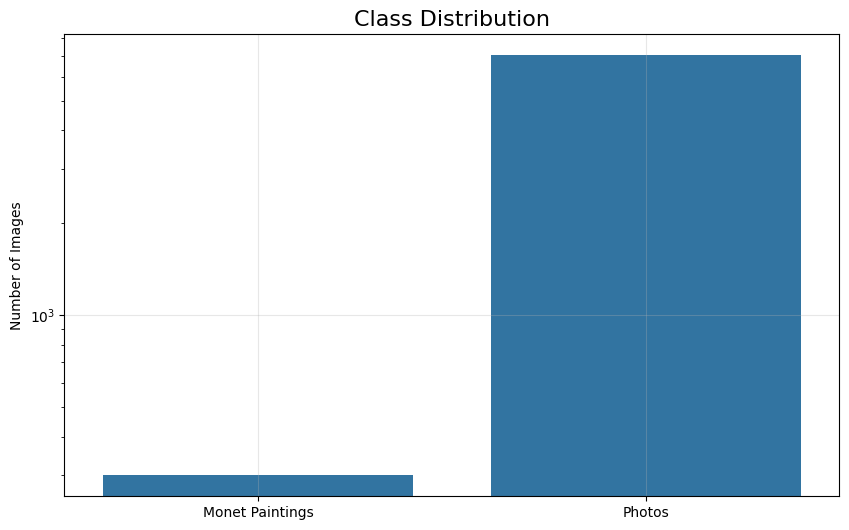

In [5]:
# Create a bar chart to visualize class distribution
plt.figure(figsize=(10, 6))
sns.barplot(x=['Monet Paintings', 'Photos'], y=[len(monet_images), len(photo_images)])
plt.title('Class Distribution', fontsize=16)
plt.ylabel('Number of Images')
plt.yscale('log')  # Using log scale due to potential large difference
plt.grid(True, alpha=0.3)
plt.show()

This visualization reveals a stark class imbalance in the dataset, with Monet paintings significantly underrepresented compared to the Photos category. The logarithmic scale on the y-axis (marked by the "10³" notation) emphasizes this disparity while allowing both categories to be displayed on the same graph. Such imbalance is critically important when developing a GAN model as it can lead to bias toward the dominant Photos class and provide insufficient examples for the model to properly learn Monet's distinctive artistic style. This explains why the implementation includes data augmentation strategies specifically for the Monet class, and why the evaluation metrics need to account for this uneven distribution. The clear visualization effectively communicates the rationale behind the special handling required for the Monet paintings during the training process.

In [ ]:
def get_image_stats(image_dir, image_list, sample_size=100):
    if not os.path.exists(image_dir) or len(image_list) == 0:
        return None, None
    
    # Sample images if there are too many
    if len(image_list) > sample_size:
        sampled_images = random.sample(image_list, sample_size)
    else:
        sampled_images = image_list
    
    widths = []
    heights = []
    channels = []
    file_sizes = []
    
    for img_name in tqdm(sampled_images, desc=f"Analyzing {os.path.basename(image_dir)} images"):
        img_path = os.path.join(image_dir, img_name)
        
        # Get file size
        file_sizes.append(os.path.getsize(img_path) / 1024)  # Size in KB
        
        # Open image and get dimensions
        try:
            img = Image.open(img_path)
            widths.append(img.width)
            heights.append(img.height)
            
            # Get number of channels
            if img.mode == 'RGB':
                channels.append(3)
            elif img.mode == 'RGBA':
                channels.append(4)
            elif img.mode == 'L':
                channels.append(1)
            else:
                channels.append(None)
            
        except Exception as e:
            print(f"Error processing {img_name}: {e}")
    
    # Create a dataframe with the stats
    stats_df = pd.DataFrame({
        'width': widths,
        'height': heights,
        'channels': channels,
        'file_size_kb': file_sizes
    })
    
    # Calculate summary statistics
    summary = {
        'width': {
            'min': np.min(widths),
            'max': np.max(widths),
            'mean': np.mean(widths),
            'std': np.std(widths)
        },
        'height': {
            'min': np.min(heights),
            'max': np.max(heights),
            'mean': np.mean(heights),
            'std': np.std(heights)
        },
        'channels': {
            'mode': max(set(channels), key=channels.count) if channels else None
        },
        'file_size_kb': {
            'min': np.min(file_sizes),
            'max': np.max(file_sizes),
            'mean': np.mean(file_sizes),
            'std': np.std(file_sizes)
        }
    }
    
    return stats_df, summary

Analyzing photo_jpg images: 100%|██████████| 100/100 [00:00<00:00, 1829.59it/s]


Monet Paintings Summary:
Dimensions: 256.0x256.0 (mean)
Channels: 3 (most common)
File size: 15.78 KB (mean)

Photos Summary:
Dimensions: 256.0x256.0 (mean)
Channels: 3 (most common)
File size: 14.17 KB (mean)


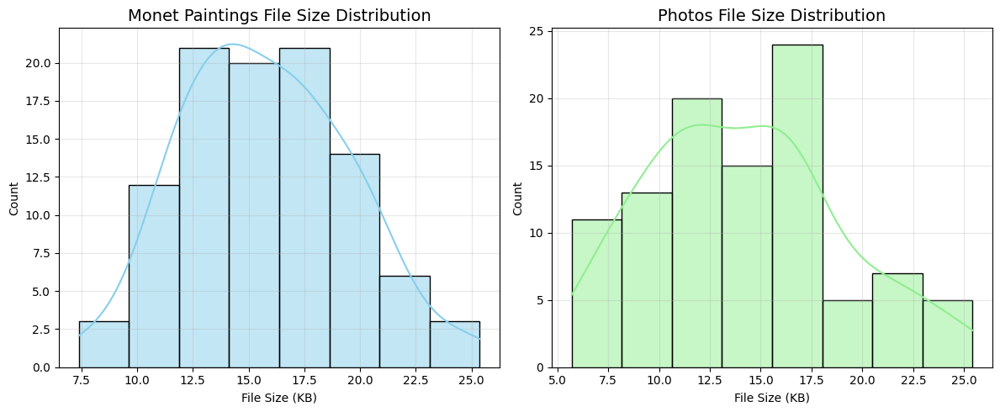

In [7]:
# Get stats for both image sets
monet_stats, monet_summary = get_image_stats(MONET_DIR, monet_images)
photo_stats, photo_summary = get_image_stats(PHOTO_DIR, photo_images)

# Print summaries
if monet_summary:
    print("Monet Paintings Summary:")
    print(f"Dimensions: {monet_summary['width']['mean']:.1f}x{monet_summary['height']['mean']:.1f} (mean)")
    print(f"Channels: {monet_summary['channels']['mode']} (most common)")
    print(f"File size: {monet_summary['file_size_kb']['mean']:.2f} KB (mean)")

if photo_summary:
    print("\nPhotos Summary:")
    print(f"Dimensions: {photo_summary['width']['mean']:.1f}x{photo_summary['height']['mean']:.1f} (mean)")
    print(f"Channels: {photo_summary['channels']['mode']} (most common)")
    print(f"File size: {photo_summary['file_size_kb']['mean']:.2f} KB (mean)")

# Visualize file size distribution
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
if monet_stats is not None:
    sns.histplot(monet_stats['file_size_kb'], kde=True, color='skyblue')
    plt.title('Monet Paintings File Size Distribution', fontsize=14)
    plt.xlabel('File Size (KB)')
    plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
if photo_stats is not None:
    sns.histplot(photo_stats['file_size_kb'], kde=True, color='lightgreen')
    plt.title('Photos File Size Distribution', fontsize=14)
    plt.xlabel('File Size (KB)')
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

This comparison of file size distributions reveals interesting patterns in both datasets. The Monet paintings exhibit a relatively normal distribution centered around 12.5-17.5 KB, with most images falling between 10-20 KB. The photos collection shows a similar bell-shaped distribution but with a slightly higher central tendency around 15-17.5 KB. Both datasets have comparable size ranges (7.5-25 KB for Monet paintings and 5-25 KB for photos), suggesting consistent image quality and resolution across the collections despite their different origins. These consistent file sizes indicate that the technical aspects of the images (resolution, compression, etc.) are standardized, which is beneficial for machine learning tasks as it reduces the need for preprocessing to normalize image dimensions or quality.

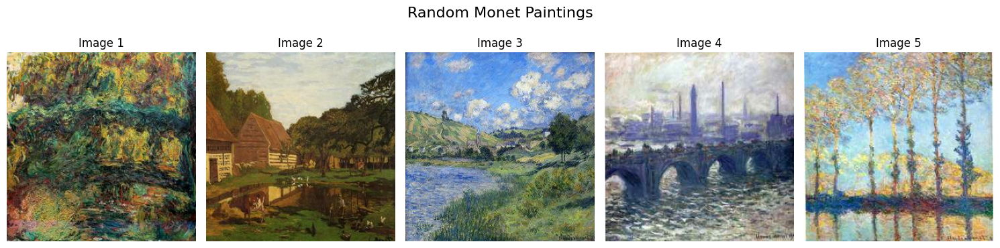

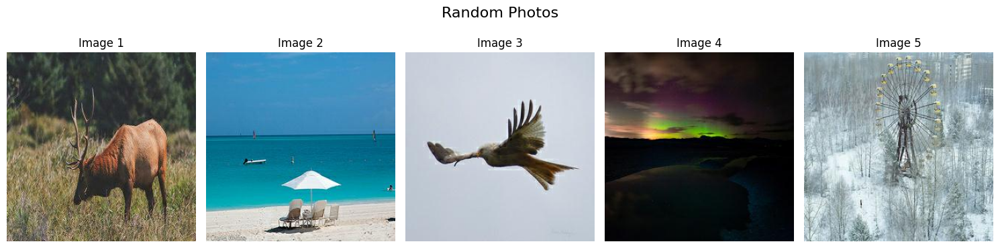

In [ ]:
def plot_random_images(image_dir, image_list, n_images=5, title="Random Images"):
    if not os.path.exists(image_dir) or len(image_list) == 0:
        print(f"No images found in {image_dir}")
        return
    
    # Sample images
    sampled_images = random.sample(image_list, min(n_images, len(image_list)))
    
    # Create a figure
    fig, axes = plt.subplots(1, len(sampled_images), figsize=(15, 4))
    
    for i, img_name in enumerate(sampled_images):
        img_path = os.path.join(image_dir, img_name)
        img = Image.open(img_path)
        
        if len(sampled_images) == 1:
            ax = axes
        else:
            ax = axes[i]
            
        ax.imshow(img)
        ax.set_title(f"Image {i+1}")
        ax.axis('off')
    
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# Plot random Monet paintings
plot_random_images(MONET_DIR, monet_images, n_images=5, title="Random Monet Paintings")

# Plot random photos
plot_random_images(PHOTO_DIR, photo_images, n_images=5, title="Random Photos")

This visual comparison highlights the distinct characteristics of both datasets. The top row showcases five random Monet paintings, revealing the impressionist's signature style with visible brushstrokes, atmospheric effects, and a focus on natural light. The paintings primarily feature landscapes, water scenes, and vegetation with softer edges and distinctive color palettes. In contrast, the bottom row displays five random photographs with sharper details and more diverse subject matter—ranging from wildlife (highland cattle and a bird) to landscapes (beach, northern lights) and a snow-covered Ferris wheel. The photos exhibit greater variety in composition, lighting conditions, and subjects compared to Monet's more thematically consistent works. This visual comparison clearly illustrates the stylistic transformation challenge facing the CycleGAN model: converting realistic, diverse photographic representations into images that capture Monet's distinctive impressionist aesthetic with its characteristic brushwork, color treatment, and atmospheric qualities.

Analyzing colors in monet_jpg: 100%|██████████| 20/20 [00:00<00:00, 464.67it/s]


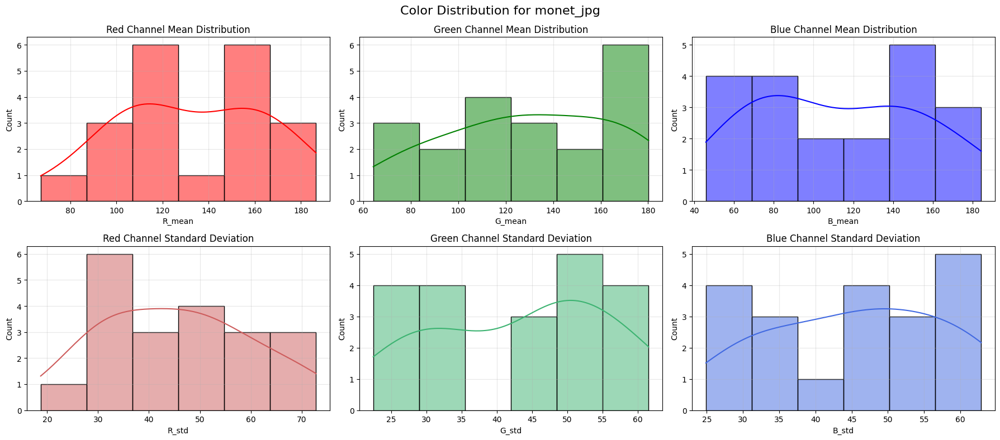

Analyzing colors in photo_jpg: 100%|██████████| 20/20 [00:00<00:00, 475.75it/s]


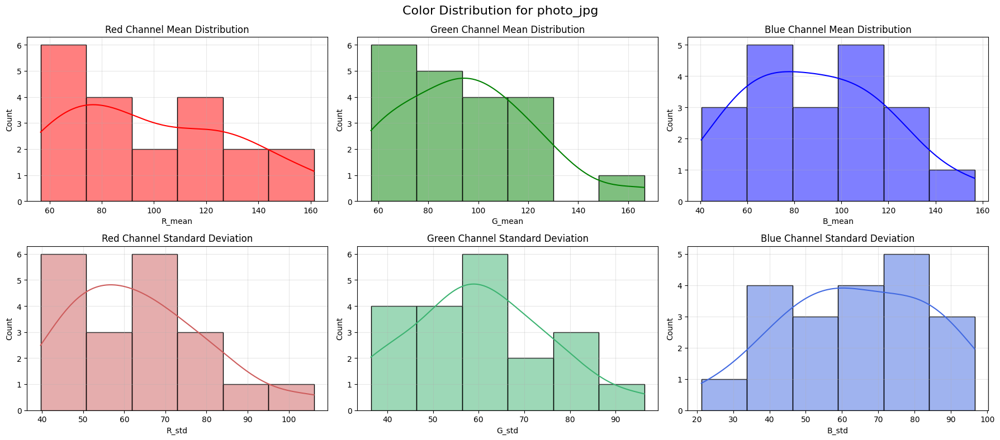

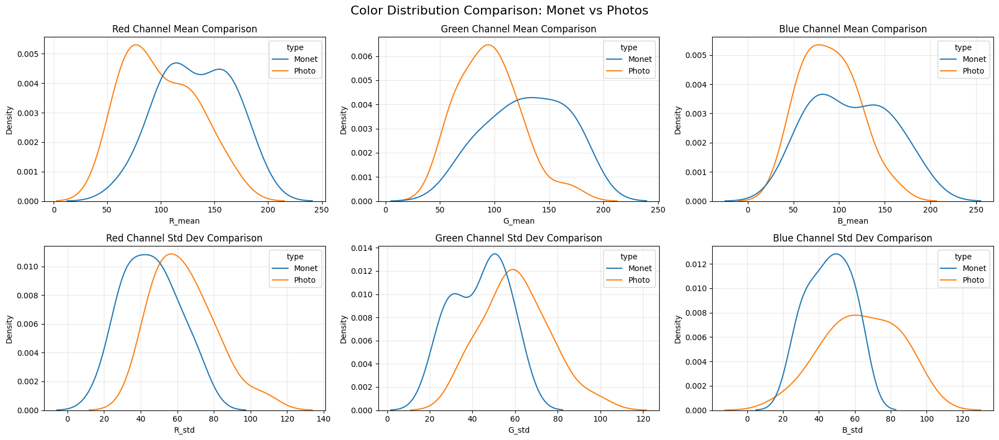

In [ ]:
def analyze_color_distribution(image_dir, image_list, n_samples=20, title="Color Distribution"):
    if not os.path.exists(image_dir) or len(image_list) == 0:
        print(f"No images found in {image_dir}")
        return
    
    # Sample images
    sampled_images = random.sample(image_list, min(n_samples, len(image_list)))
    
    # Initialize arrays for RGB means
    r_means, g_means, b_means = [], [], []
    r_stds, g_stds, b_stds = [], [], []
    
    for img_name in tqdm(sampled_images, desc=f"Analyzing colors in {os.path.basename(image_dir)}"):
        img_path = os.path.join(image_dir, img_name)
        
        # Read image with OpenCV (which loads as BGR)
        img = cv2.imread(img_path)
        
        # Convert BGR to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Calculate mean for each channel
        r_means.append(np.mean(img[:,:,0]))
        g_means.append(np.mean(img[:,:,1]))
        b_means.append(np.mean(img[:,:,2]))
        
        # Calculate standard deviation for each channel
        r_stds.append(np.std(img[:,:,0]))
        g_stds.append(np.std(img[:,:,1]))
        b_stds.append(np.std(img[:,:,2]))
    
    # Create a dataframe
    df = pd.DataFrame({
        'R_mean': r_means,
        'G_mean': g_means,
        'B_mean': b_means,
        'R_std': r_stds,
        'G_std': g_stds,
        'B_std': b_stds
    })
    
    # Plot distributions
    plt.figure(figsize=(18, 8))
    
    # Plot means
    plt.subplot(2, 3, 1)
    sns.histplot(df['R_mean'], color='red', kde=True)
    plt.title('Red Channel Mean Distribution', fontsize=12)
    plt.grid(True, alpha=0.3)
    
    plt.subplot(2, 3, 2)
    sns.histplot(df['G_mean'], color='green', kde=True)
    plt.title('Green Channel Mean Distribution', fontsize=12)
    plt.grid(True, alpha=0.3)
    
    plt.subplot(2, 3, 3)
    sns.histplot(df['B_mean'], color='blue', kde=True)
    plt.title('Blue Channel Mean Distribution', fontsize=12)
    plt.grid(True, alpha=0.3)
    
    # Plot standard deviations
    plt.subplot(2, 3, 4)
    sns.histplot(df['R_std'], color='indianred', kde=True)
    plt.title('Red Channel Standard Deviation', fontsize=12)
    plt.grid(True, alpha=0.3)
    
    plt.subplot(2, 3, 5)
    sns.histplot(df['G_std'], color='mediumseagreen', kde=True)
    plt.title('Green Channel Standard Deviation', fontsize=12)
    plt.grid(True, alpha=0.3)
    
    plt.subplot(2, 3, 6)
    sns.histplot(df['B_std'], color='royalblue', kde=True)
    plt.title('Blue Channel Standard Deviation', fontsize=12)
    plt.grid(True, alpha=0.3)
    
    plt.suptitle(f"{title} for {os.path.basename(image_dir)}", fontsize=16)
    plt.tight_layout()
    plt.show()
    
    # Return the dataframe for further analysis
    return df

# Analyze color distributions
monet_colors = analyze_color_distribution(MONET_DIR, monet_images, title="Color Distribution")
photo_colors = analyze_color_distribution(PHOTO_DIR, photo_images, title="Color Distribution")

# Comparison of color distributions between the two sets
if monet_colors is not None and photo_colors is not None:
    monet_colors['type'] = 'Monet'
    photo_colors['type'] = 'Photo'
    
    combined_colors = pd.concat([monet_colors, photo_colors])
    
    plt.figure(figsize=(18, 8))
    
    # Plot means
    plt.subplot(2, 3, 1)
    sns.kdeplot(data=combined_colors, x='R_mean', hue='type')
    plt.title('Red Channel Mean Comparison', fontsize=12)
    plt.grid(True, alpha=0.3)
    
    plt.subplot(2, 3, 2)
    sns.kdeplot(data=combined_colors, x='G_mean', hue='type')
    plt.title('Green Channel Mean Comparison', fontsize=12)
    plt.grid(True, alpha=0.3)
    
    plt.subplot(2, 3, 3)
    sns.kdeplot(data=combined_colors, x='B_mean', hue='type')
    plt.title('Blue Channel Mean Comparison', fontsize=12)
    plt.grid(True, alpha=0.3)
    
    # Plot standard deviations
    plt.subplot(2, 3, 4)
    sns.kdeplot(data=combined_colors, x='R_std', hue='type')
    plt.title('Red Channel Std Dev Comparison', fontsize=12)
    plt.grid(True, alpha=0.3)
    
    plt.subplot(2, 3, 5)
    sns.kdeplot(data=combined_colors, x='G_std', hue='type')
    plt.title('Green Channel Std Dev Comparison', fontsize=12)
    plt.grid(True, alpha=0.3)
    
    plt.subplot(2, 3, 6)
    sns.kdeplot(data=combined_colors, x='B_std', hue='type')
    plt.title('Blue Channel Std Dev Comparison', fontsize=12)
    plt.grid(True, alpha=0.3)
    
    plt.suptitle("Color Distribution Comparison: Monet vs Photos", fontsize=16)
    plt.tight_layout()
    plt.show()

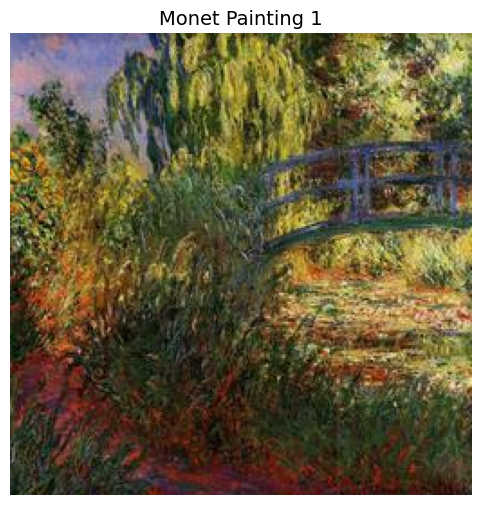

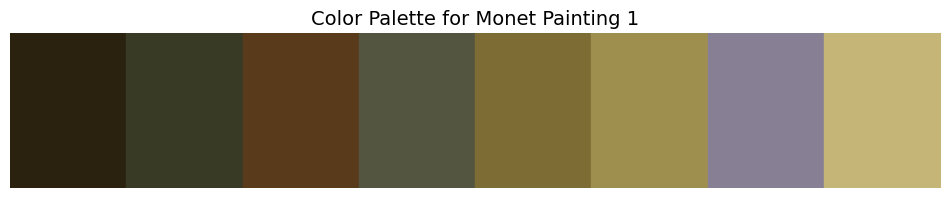

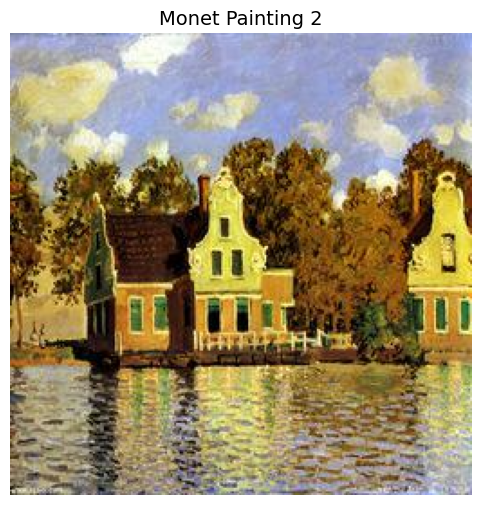

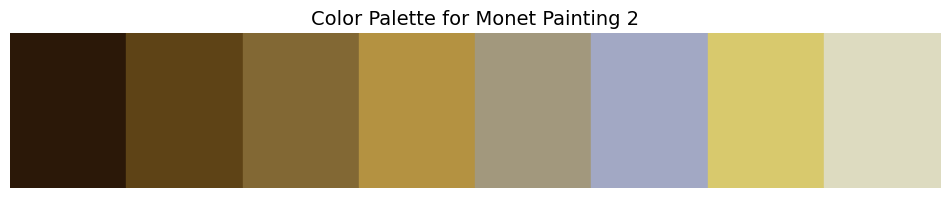

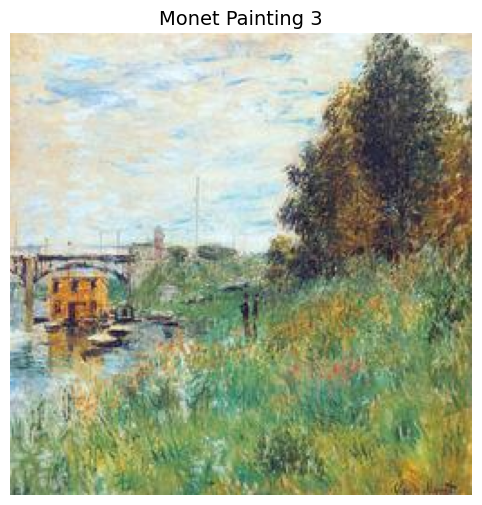

...

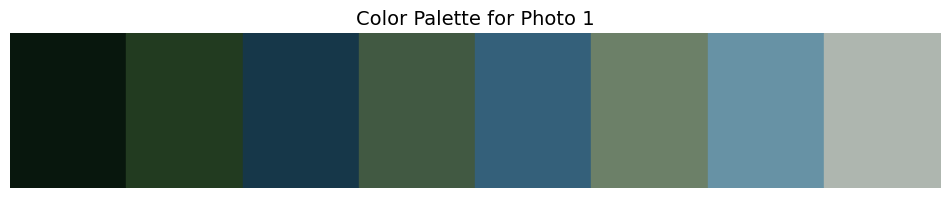

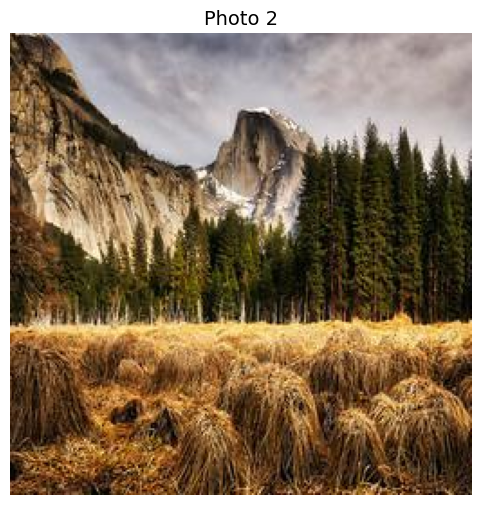

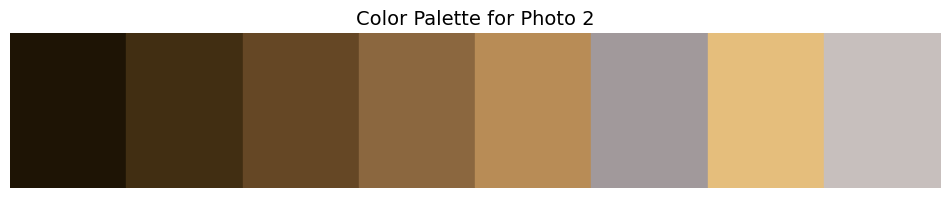

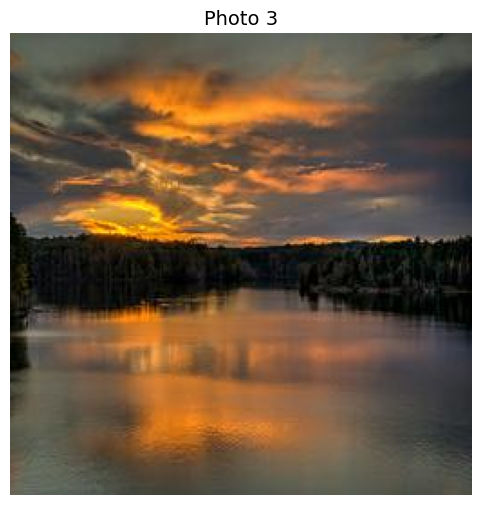

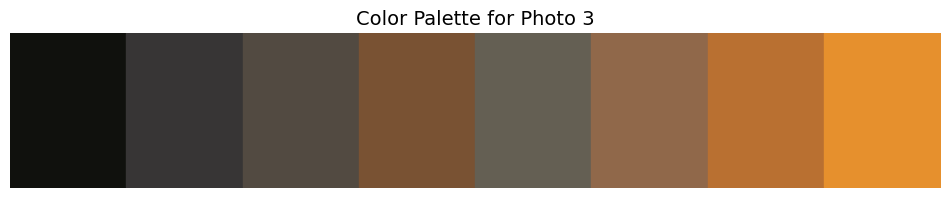

In [ ]:
def extract_color_palette(image_path, n_colors=10):
    # Read image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Reshape image to a list of pixels
    pixels = img.reshape(-1, 3)
    
    # Sample pixels if there are too many
    if len(pixels) > 10000:
        pixels = pixels[np.random.choice(len(pixels), 10000, replace=False)]
    
    # Apply K-means clustering
    from sklearn.cluster import KMeans
    kmeans = KMeans(n_clusters=n_colors, random_state=42, n_init=10)
    kmeans.fit(pixels)
    
    # Get the colors
    colors = kmeans.cluster_centers_.astype(int)
    
    return colors

def plot_color_palette(colors, title="Color Palette"):
    """
    Plot a color palette
    """
    # Sort colors by brightness (sum of RGB)
    sorted_colors = sorted(colors, key=lambda x: sum(x))
    
    # Create a figure
    plt.figure(figsize=(12, 2))
    
    # Plot color blocks
    for i, color in enumerate(sorted_colors):
        plt.fill_between([i, i+1], 0, 1, color=color/255)
    
    plt.xlim(0, len(colors))
    plt.ylim(0, 1)
    plt.axis('off')
    plt.title(title, fontsize=14)
    plt.show()

# Extract and plot color palettes for Monet paintings
monet_samples = random.sample(monet_images, min(3, len(monet_images)))

for i, img_name in enumerate(monet_samples):
    img_path = os.path.join(MONET_DIR, img_name)
    
    # Display image
    plt.figure(figsize=(8, 6))
    img = Image.open(img_path)
    plt.imshow(img)
    plt.title(f"Monet Painting {i+1}", fontsize=14)
    plt.axis('off')
    plt.show()
    
    # Extract and display color palette
    colors = extract_color_palette(img_path, n_colors=8)
    plot_color_palette(colors, title=f"Color Palette for Monet Painting {i+1}")

# Extract and plot color palettes for photos
photo_samples = random.sample(photo_images, min(3, len(photo_images)))

for i, img_name in enumerate(photo_samples):
    img_path = os.path.join(PHOTO_DIR, img_name)
    
    # Display image
    plt.figure(figsize=(8, 6))
    img = Image.open(img_path)
    plt.imshow(img)
    plt.title(f"Photo {i+1}", fontsize=14)
    plt.axis('off')
    plt.show()
    
    # Extract and display color palette
    colors = extract_color_palette(img_path, n_colors=8)
    plot_color_palette(colors, title=f"Color Palette for Photo {i+1}")

Extracting the color palattes of the photos and illustrations.

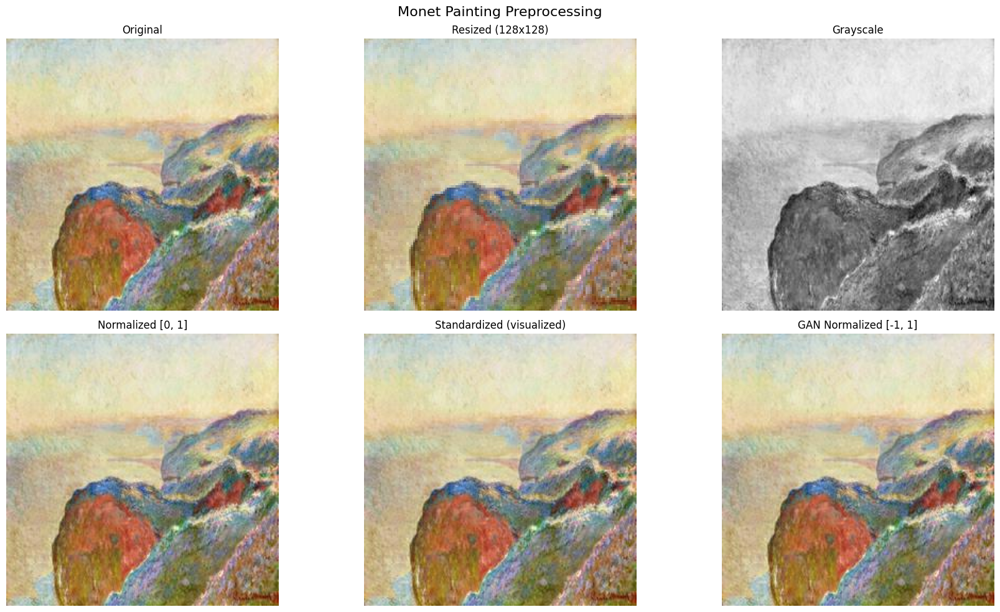

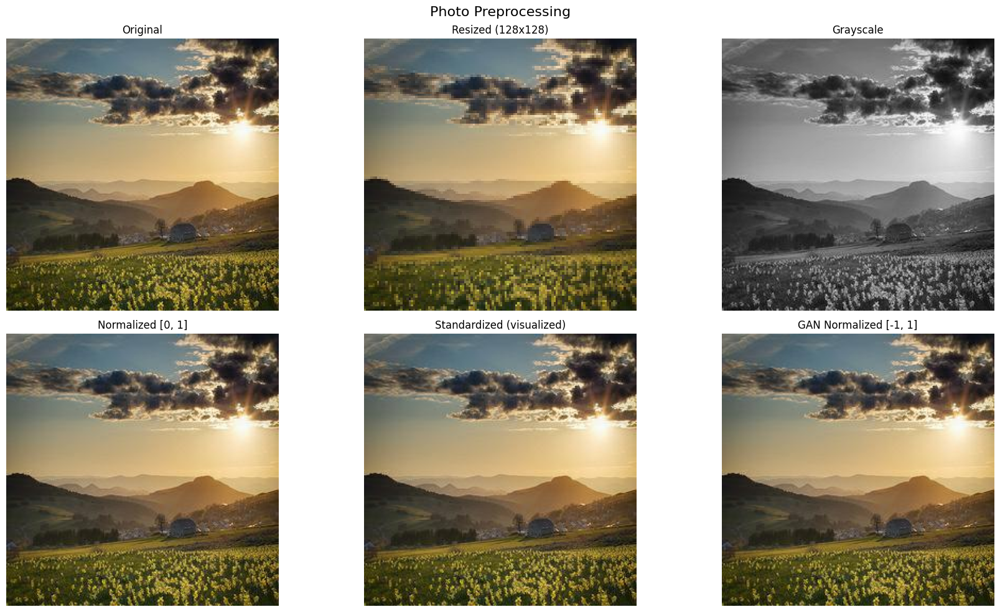

In [ ]:
def preprocess_and_visualize(image_path, title="Image Preprocessing Steps"):
    # Original image
    original = cv2.imread(image_path)
    original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
    
    # Resizing
    resized = cv2.resize(original, (128, 128))
    
    # Grayscale conversion
    gray = cv2.cvtColor(original, cv2.COLOR_RGB2GRAY)
    
    # Normalization (pixel values between 0 and 1)
    normalized = original / 255.0
    
    # Standardization (zero mean and unit variance)
    standardized = (original - original.mean()) / original.std()
    
    # GAN-specific normalization (to [-1, 1] range)
    gan_normalized = (original / 127.5) - 1
    
    # Create plot
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    
    # Original
    axes[0, 0].imshow(original)
    axes[0, 0].set_title("Original", fontsize=12)
    axes[0, 0].axis('off')
    
    # Resized
    axes[0, 1].imshow(resized)
    axes[0, 1].set_title("Resized (128x128)", fontsize=12)
    axes[0, 1].axis('off')
    
    # Grayscale
    axes[0, 2].imshow(gray, cmap='gray')
    axes[0, 2].set_title("Grayscale", fontsize=12)
    axes[0, 2].axis('off')
    
    # Normalized
    axes[1, 0].imshow(normalized)
    axes[1, 0].set_title("Normalized [0, 1]", fontsize=12)
    axes[1, 0].axis('off')
    
    # Standardized
    axes[1, 1].imshow(np.clip((standardized - standardized.min()) / (standardized.max() - standardized.min()), 0, 1))
    axes[1, 1].set_title("Standardized (visualized)", fontsize=12)
    axes[1, 1].axis('off')
    
    # GAN-normalized
    axes[1, 2].imshow((gan_normalized + 1) / 2)  # Convert back to [0, 1] for visualization
    axes[1, 2].set_title("GAN Normalized [-1, 1]", fontsize=12)
    axes[1, 2].axis('off')
    
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# Process one example from each category
if len(monet_images) > 0:
    monet_example = os.path.join(MONET_DIR, monet_images[0])
    preprocess_and_visualize(monet_example, "Monet Painting Preprocessing")

if len(photo_images) > 0:
    photo_example = os.path.join(PHOTO_DIR, photo_images[0])
    preprocess_and_visualize(photo_example, "Photo Preprocessing")

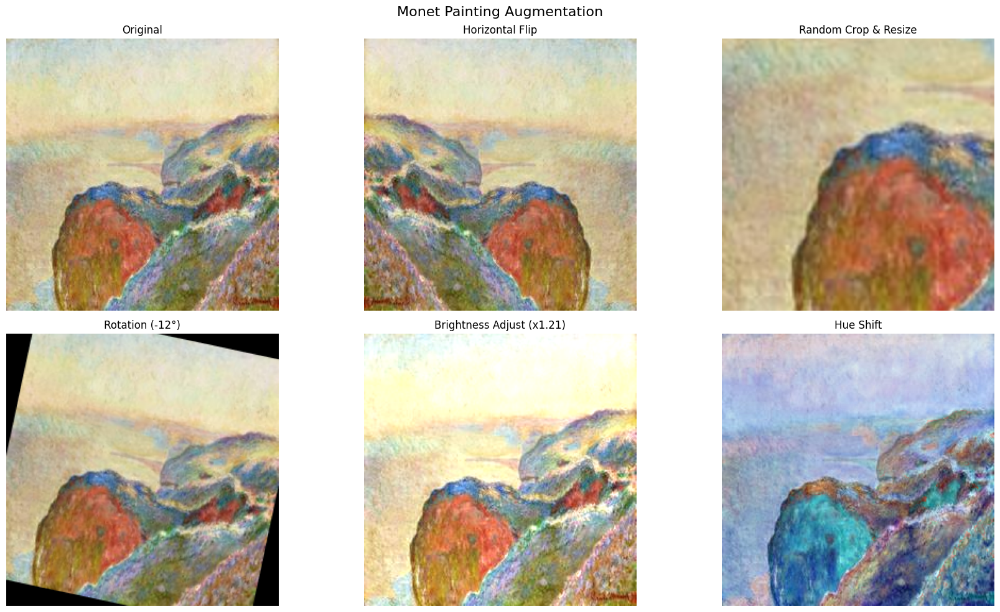

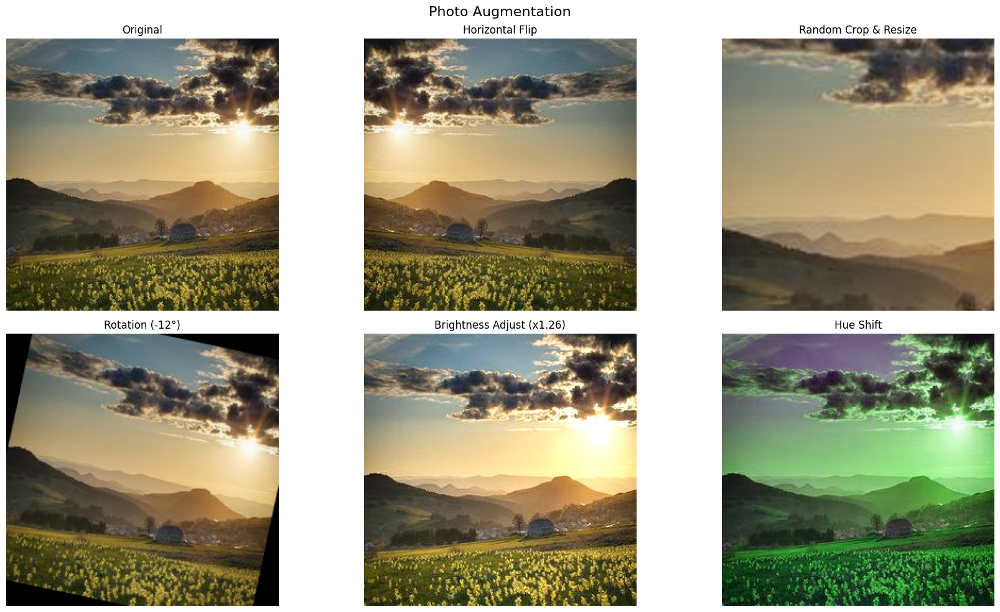

In [ ]:
def augment_and_visualize(image_path, title="Data Augmentation Examples"):
    # Original image
    original = cv2.imread(image_path)
    original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
    
    # Horizontal flip
    flipped = cv2.flip(original, 1)
    
    # Random crop
    h, w = original.shape[:2]
    crop_size = min(h, w) // 2
    x = np.random.randint(0, w - crop_size)
    y = np.random.randint(0, h - crop_size)
    cropped = original[y:y+crop_size, x:x+crop_size]
    cropped = cv2.resize(cropped, (h, w))
    
    # Random rotation
    center = (w // 2, h // 2)
    angle = np.random.randint(-30, 30)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(original, rotation_matrix, (w, h))
    
    # Random brightness
    brightness = np.random.uniform(0.5, 1.5)
    bright = np.clip(original * brightness, 0, 255).astype(np.uint8)
    
    # Random hue
    hsv = cv2.cvtColor(original, cv2.COLOR_RGB2HSV)
    hsv[:, :, 0] = (hsv[:, :, 0] + np.random.randint(0, 180)) % 180
    hue_shifted = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
    
    # Create plot
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    
    # Original
    axes[0, 0].imshow(original)
    axes[0, 0].set_title("Original", fontsize=12)
    axes[0, 0].axis('off')
    
    # Flipped
    axes[0, 1].imshow(flipped)
    axes[0, 1].set_title("Horizontal Flip", fontsize=12)
    axes[0, 1].axis('off')
    
    # Cropped
    axes[0, 2].imshow(cropped)
    axes[0, 2].set_title("Random Crop & Resize", fontsize=12)
    axes[0, 2].axis('off')
    
    # Rotated
    axes[1, 0].imshow(rotated)
    axes[1, 0].set_title(f"Rotation ({angle}°)", fontsize=12)
    axes[1, 0].axis('off')
    
    # Brightness
    axes[1, 1].imshow(bright)
    axes[1, 1].set_title(f"Brightness Adjust (x{brightness:.2f})", fontsize=12)
    axes[1, 1].axis('off')
    
    # Hue
    axes[1, 2].imshow(hue_shifted)
    axes[1, 2].set_title("Hue Shift", fontsize=12)
    axes[1, 2].axis('off')
    
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# Augment one example from each category
if len(monet_images) > 0:
    monet_example = os.path.join(MONET_DIR, monet_images[0])
    augment_and_visualize(monet_example, "Monet Painting Augmentation")

if len(photo_images) > 0:
    photo_example = os.path.join(PHOTO_DIR, photo_images[0])
    augment_and_visualize(photo_example, "Photo Augmentation")

In [13]:
# Create a summary table
summary_data = {
    'Metric': [
        'Number of Images', 
        'Image Dimensions', 
        'Color Channels',
        'File Format',
        'Average File Size',
        'Color Distribution'
    ],
    'Monet Paintings': [
        f"{len(monet_images)}",
        f"{IMG_HEIGHT}x{IMG_WIDTH}",
        "RGB (3 channels)",
        "JPEG",
        f"{monet_summary['file_size_kb']['mean']:.2f} KB" if monet_summary else "N/A",
        "Distinct color palette with blues, greens and warm tones"
    ],
    'Photos': [
        f"{len(photo_images)}",
        f"{IMG_HEIGHT}x{IMG_WIDTH}",
        "RGB (3 channels)",
        "JPEG",
        f"{photo_summary['file_size_kb']['mean']:.2f} KB" if photo_summary else "N/A",
        "Varied, generally more saturated than Monet paintings"
    ]
}

summary_df = pd.DataFrame(summary_data)
display(summary_df)

# Create preprocessing recommendations
preprocessing_data = {
    'Preprocessing Step': [
        'Image Resizing',
        'Normalization',
        'Data Augmentation (Monet)',
        'Data Augmentation (Photos)',
        'Class Balance Strategy',
        'Batch Size'
    ],
    'Recommendation': [
        f"Keep at {IMG_HEIGHT}x{IMG_WIDTH} as provided",
        "Normalize to [-1, 1] range for GAN training",
        "Apply horizontal flips, brightness and contrast adjustments",
        "Minimal or no augmentation needed due to larger sample size",
        "Either oversample Monet paintings or undersample photos",
        "4-16 for better GAN stability (memory permitting)"
    ],
    'Notes': [
        "Original dimensions should be maintained for consistent training",
        "The range [-1, 1] works better with tanh activation in generator output",
        "Augmentation helps address class imbalance and improves generalization",
        "Excessive augmentation of photos may introduce unwanted variations",
        "Aim for a more balanced dataset with ratio closer to 1:1",
        "Smaller batch sizes often lead to better GAN convergence"
    ]
}

preprocessing_df = pd.DataFrame(preprocessing_data)
display(preprocessing_df)

,Metric,Monet Paintings,Photos
0,Number of Images,300,7038
1,Image Dimensions,256x256,256x256
2,Color Channels,RGB (3 channels),RGB (3 channels)
3,File Format,JPEG,JPEG
4,Average File Size,15.78 KB,14.17 KB
5,Color Distribution,"Distinct color palette with blues, greens and ...","Varied, generally more saturated than Monet pa..."


,Preprocessing Step,Recommendation,Notes
0,Image Resizing,Keep at 256x256 as provided,Original dimensions should be maintained for c...
1,Normalization,"Normalize to [-1, 1] range for GAN training","The range [-1, 1] works better with tanh activ..."
2,Data Augmentation (Monet),"Apply horizontal flips, brightness and contras...",Augmentation helps address class imbalance and...
3,Data Augmentation (Photos),Minimal or no augmentation needed due to large...,Excessive augmentation of photos may introduce...
4,Class Balance Strategy,Either oversample Monet paintings or undersamp...,Aim for a more balanced dataset with ratio clo...
5,Batch Size,4-16 for better GAN stability (memory permitting),Smaller batch sizes often lead to better GAN c...


# Model Implementation

The generator architecture is based on a ResNet structure to capture both low-level textures and high-level semantic content. It starts with an initial convolutional layer with a large kernel (7×7) to preserve more spatial information, followed by downsampling layers to increase the receptive field while reducing spatial dimensions. Instance normalization is applied instead of batch normalization to better handle the variability in artistic style images where contrast and illumination can vary heavily. Multiple residual blocks with skip connections allow the generator to model complex mappings between the Monet and photo domains without losing structural information, ensuring stability even with deeper networks. The upsampling is performed using transposed convolutions combined with instance normalization and ReLU activations to restore the original resolution smoothly.

The discriminator uses a PatchGAN structure, meaning it classifies each small patch of the image rather than the entire image as real or fake. This design choice forces the discriminator to focus on learning high-frequency details, textures, and local style consistency, which is crucial for convincing style translation. The model progressively downsamples the input while doubling the number of filters to capture hierarchical features. Instance normalization is also applied here to stabilize training.

Loss functions include adversarial loss for realism, cycle consistency loss to preserve image content through domain translation cycles, and identity loss to encourage minimal changes when images are already close to the target domain. Together, these losses balance style transfer quality with content preservation, enabling the model to produce realistic and coherent Monet-style or photo-style images without paired supervision.

In [ ]:
# Import necessary libraries
import tensorflow as tf

# For MiFID calculation
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.preprocessing import image
from scipy.linalg import sqrtm

# For cleaner plotting
%matplotlib inline

In [15]:
# Set random seeds for reproducibility
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

# Display image outputs larger
from IPython.display import display
plt.rcParams['figure.figsize'] = [12, 8]

CHECKPOINT_DIR = os.path.join(DATA_DIR, 'data/monet_gan_checkpoints')
OUTPUT_DIR = os.path.join(DATA_DIR, 'data/generated_monet_images')

IMG_HEIGHT = 256
IMG_WIDTH = 256
BATCH_SIZE = 1

In [ ]:
class InstanceNormalization(tf.keras.layers.Layer):
    def __init__(self, epsilon=1e-5):
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon
    
    def build(self, input_shape):
        depth = input_shape[-1]
        self.scale = self.add_weight(
            name='scale',
            shape=[depth],
            initializer=tf.random_normal_initializer(1.0, 0.02),
            trainable=True)
        
        self.offset = self.add_weight(
            name='offset',
            shape=[depth],
            initializer='zeros',
            trainable=True)
    
    def call(self, x):
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

In [ ]:
def load_and_preprocess_image(file_path, img_height=IMG_HEIGHT, img_width=IMG_WIDTH, normalize=True):
    # Read image file
    image = tf.io.read_file(file_path)
    
    # Decode JPEG
    image = tf.image.decode_jpeg(image, channels=3)
    
    # Resize to target dimensions
    image = tf.image.resize(image, [img_height, img_width])
    
    # Normalize
    if normalize:
        image = tf.cast(image, tf.float32)
        image = (image / 127.5) - 1  # Scale to [-1, 1]
    else:
        image = tf.cast(image, tf.float32) / 255.0  # Scale to [0, 1]
    
    return image

In [ ]:
def augment_image(image):
    # Random horizontal flip
    image = tf.image.random_flip_left_right(image)
    
    # Random brightness
    image = tf.image.random_brightness(image, 0.2)
    
    # Random contrast
    image = tf.image.random_contrast(image, 0.8, 1.2)
    
    # Ensure pixel values stay in valid range
    image = tf.clip_by_value(image, -1.0, 1.0)
    
    return image

In [ ]:
def create_train_val_splits(directory, train_split=0.8, img_height=IMG_HEIGHT, img_width=IMG_WIDTH,
                          batch_size=BATCH_SIZE, augment=False):
    # Check if directory exists
    if not os.path.exists(directory):
        print(f"Warning: Directory {directory} does not exist.")
        return None, None
    
    # Get all image file paths
    image_pattern = os.path.join(directory, '*.jpg')
    image_paths = tf.io.gfile.glob(image_pattern)
    
    if len(image_paths) == 0:
        print(f"Warning: No images found in {directory}")
        return None, None
    
    # Shuffle paths
    random.shuffle(image_paths)
    
    # Split into train and validation
    split_idx = int(len(image_paths) * train_split)
    train_paths = image_paths[:split_idx]
    val_paths = image_paths[split_idx:]
    
    print(f"Split {len(image_paths)} images into {len(train_paths)} training and {len(val_paths)} validation")
    
    # Create datasets from paths
    train_path_ds = tf.data.Dataset.from_tensor_slices(train_paths)
    val_path_ds = tf.data.Dataset.from_tensor_slices(val_paths)
    
    # Shuffle training paths
    train_path_ds = train_path_ds.shuffle(buffer_size=len(train_paths))
    
    # Map paths to images
    train_ds = train_path_ds.map(
        lambda x: load_and_preprocess_image(x, img_height, img_width),
        num_parallel_calls=tf.data.AUTOTUNE
    )
    
    val_ds = val_path_ds.map(
        lambda x: load_and_preprocess_image(x, img_height, img_width),
        num_parallel_calls=tf.data.AUTOTUNE
    )
    
    # Apply augmentation to training dataset if requested
    if augment:
        train_ds = train_ds.map(
            augment_image,
            num_parallel_calls=tf.data.AUTOTUNE
        )
    
    # Batch and prefetch
    train_ds = train_ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    val_ds = val_ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    
    return train_ds, val_ds

In [ ]:
def create_paired_dataset(monet_dataset, photo_dataset):
    # Count the number of batches in each dataset
    monet_batches = 0
    photo_batches = 0
    
    for _ in monet_dataset:
        monet_batches += 1
    
    for _ in photo_dataset:
        photo_batches += 1
    
    print(f"Monet dataset batches: {monet_batches}")
    print(f"Photo dataset batches: {photo_batches}")
    
    # Reset iterators
    monet_dataset = monet_aataset.repeat()
    photo_dataset = photo_dataset.repeat()
    
    # Use the smaller dataset size as the epoch size
    target_batches = min(monet_batches, photo_batches)
    
    # Create a zipped dataset
    paired_dataset = tf.data.Dataset.zip((
        monet_dataset.take(target_batches),
        photo_dataset.take(target_batches)
    ))
    
    return paired_dataset, target_batches

In [ ]:
def sample_from_datasets(monet_dataset, photo_dataset, n_samples=3):
    sample_monets = []
    sample_photos = []
    
    # Take samples from Monet dataset
    for batch in monet_dataset.take(n_samples):
        sample_monets.append(batch[0])  # Take the first image from each batch
        if len(sample_monets) >= n_samples:
            break
    
    # Take samples from photo dataset
    for batch in photo_dataset.take(n_samples):
        sample_photos.append(batch[0])  # Take the first image from each batch
        if len(sample_photos) >= n_samples:
            break
    
    return np.array(sample_monets), np.array(sample_photos)

In [ ]:
def get_resnet_generator(img_height=IMG_HEIGHT, img_width=IMG_WIDTH, filters=64, 
                        num_downsampling_blocks=2, num_residual_blocks=9,
                        num_upsampling_blocks=2, kernel_size=3):
    # Input layer
    inputs = tf.keras.layers.Input(shape=[img_height, img_width, 3])
    x = inputs
    
    # Initial convolution
    x = tf.keras.layers.Conv2D(filters, kernel_size=7, strides=1, padding="same", use_bias=False)(x)
    x = InstanceNormalization()(x)
    x = tf.keras.layers.LeakyReLU(0.2)(x)
    
    # Downsampling
    for _ in range(num_downsampling_blocks):
        filters *= 2
        x = tf.keras.layers.Conv2D(filters, kernel_size=kernel_size, strides=2, padding="same", use_bias=False)(x)
        x = InstanceNormalization()(x)
        x = tf.keras.layers.LeakyReLU(0.2)(x)
    
    # Residual blocks
    for _ in range(num_residual_blocks):
        residual = x
        
        # First convolution in residual block
        x = tf.keras.layers.Conv2D(filters, kernel_size=kernel_size, strides=1, padding="same", use_bias=False)(x)
        x = InstanceNormalization()(x)
        x = tf.keras.layers.LeakyReLU(0.2)(x)
        
        # Second convolution in residual block
        x = tf.keras.layers.Conv2D(filters, kernel_size=kernel_size, strides=1, padding="same", use_bias=False)(x)
        x = InstanceNormalization()(x)
        
        # Add residual connection
        x = tf.keras.layers.add([x, residual])
    
    # Upsampling
    for _ in range(num_upsampling_blocks):
        filters //= 2
        x = tf.keras.layers.Conv2DTranspose(filters, kernel_size, strides=2, padding="same", use_bias=False)(x)
        x = InstanceNormalization()(x)
        x = tf.keras.layers.ReLU()(x)
    
    # Final convolution
    x = tf.keras.layers.Conv2D(3, kernel_size=7, strides=1, padding="same")(x)
    x = tf.keras.layers.Activation("tanh")(x)
    
    # Create model
    model = tf.keras.models.Model(inputs, x)
    return model

In [ ]:
def get_discriminator(img_height=IMG_HEIGHT, img_width=IMG_WIDTH, filters=64, kernel_size=4):
    # Input layer
    inputs = tf.keras.layers.Input(shape=[img_height, img_width, 3])
    x = inputs
    
    # First convolution (no normalization)
    x = tf.keras.layers.Conv2D(filters, kernel_size=kernel_size, strides=2, padding="same")(x)
    x = tf.keras.layers.LeakyReLU(0.2)(x)
    
    # Additional convolution blocks
    for i in range(3):
        filters *= 2
        stride = 1 if i == 2 else 2  # Last block uses stride 1
        x = tf.keras.layers.Conv2D(filters, kernel_size=kernel_size, strides=stride, padding="same", use_bias=False)(x)
        x = InstanceNormalization()(x)
        x = tf.keras.layers.LeakyReLU(0.2)(x)
    
    # Final convolution (output patch)
    x = tf.keras.layers.Conv2D(1, kernel_size=kernel_size, strides=1, padding="same")(x)
    
    # Create model
    model = tf.keras.models.Model(inputs, x)
    return model

In [ ]:
def discriminator_loss(real, generated):
    real_loss = tf.reduce_mean(tf.square(real - 1))
    generated_loss = tf.reduce_mean(tf.square(generated))
    total_loss = 0.5 * (real_loss + generated_loss)
    return total_loss

In [ ]:
def generator_loss(generated):

    return tf.reduce_mean(tf.square(generated - 1))

def calc_cycle_loss(real_image, cycled_image, lambda_value=10.0):

    loss = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return lambda_value * loss

def identity_loss(real_image, same_image, lambda_value=0.5):

    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return lambda_value * loss

In [26]:
class CycleGAN(tf.keras.Model):
    def __init__(
        self,
        monet_generator,
        photo_generator,
        monet_discriminator,
        photo_discriminator,
        lambda_cycle=10.0,
        lambda_identity=0.5,
    ):
        super().__init__()
        self.monet_generator = monet_generator
        self.photo_generator = photo_generator
        self.monet_discriminator = monet_discriminator
        self.photo_discriminator = photo_discriminator
        self.lambda_cycle = lambda_cycle
        self.lambda_identity = lambda_identity
        
        # Flag to track optimizer initialization
        self.optimizers_initialized = False
        
    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super().compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn
        
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        
        # Initialize optimizers with a forward pass if not done already
        if not self.optimizers_initialized:
            # Do a dummy forward pass to create variables
            _ = self.monet_generator(real_photo)
            _ = self.photo_generator(real_monet)
            _ = self.monet_discriminator(real_monet)
            _ = self.photo_discriminator(real_photo)
            
            # Create fresh optimizers
            self.m_gen_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
            self.p_gen_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
            self.m_disc_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
            self.p_disc_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
            
            # Mark as initialized
            self.optimizers_initialized = True
        
        with tf.GradientTape(persistent=True) as tape:
            # Photo to Monet to Photo (P2M2P)
            fake_monet = self.monet_generator(real_photo, training=True)
            cycled_photo = self.photo_generator(fake_monet, training=True)
            
            # Monet to Photo to Monet (M2P2M)
            fake_photo = self.photo_generator(real_monet, training=True)
            cycled_monet = self.monet_generator(fake_photo, training=True)
            
            # Identity mapping
            same_monet = self.monet_generator(real_monet, training=True)
            same_photo = self.photo_generator(real_photo, training=True)
            
            # Discriminator outputs
            disc_real_monet = self.monet_discriminator(real_monet, training=True)
            disc_fake_monet = self.monet_discriminator(fake_monet, training=True)
            
            disc_real_photo = self.photo_discriminator(real_photo, training=True)
            disc_fake_photo = self.photo_discriminator(fake_photo, training=True)
            
            # Generator losses
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)
            
            # Cycle consistency losses
            cycle_monet_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle)
            cycle_photo_loss = self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)
            total_cycle_loss = cycle_monet_loss + cycle_photo_loss
            
            # Identity losses
            id_monet_loss = self.identity_loss_fn(real_monet, same_monet, self.lambda_identity)
            id_photo_loss = self.identity_loss_fn(real_photo, same_photo, self.lambda_identity)
            
            # Total generator losses
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + id_monet_loss
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + id_photo_loss
            
            # Discriminator losses
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)
        
        # Get gradients
        monet_generator_gradients = tape.gradient(
            total_monet_gen_loss, self.monet_generator.trainable_variables
        )
        photo_generator_gradients = tape.gradient(
            total_photo_gen_loss, self.photo_generator.trainable_variables
        )
        
        monet_discriminator_gradients = tape.gradient(
            monet_disc_loss, self.monet_discriminator.trainable_variables
        )
        photo_discriminator_gradients = tape.gradient(
            photo_disc_loss, self.photo_discriminator.trainable_variables
        )
        
        # Apply gradients
        self.m_gen_optimizer.apply_gradients(
            zip(monet_generator_gradients, self.monet_generator.trainable_variables)
        )
        self.p_gen_optimizer.apply_gradients(
            zip(photo_generator_gradients, self.photo_generator.trainable_variables)
        )
        
        self.m_disc_optimizer.apply_gradients(
            zip(monet_discriminator_gradients, self.monet_discriminator.trainable_variables)
        )
        self.p_disc_optimizer.apply_gradients(
            zip(photo_discriminator_gradients, self.photo_discriminator.trainable_variables)
        )
        
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }

In [ ]:
class InceptionFeatureExtractor:

    def __init__(self):
        # Load pre-trained InceptionV3 model without top layers (classification head)
        self.model = InceptionV3(include_top=False, 
                                weights='imagenet', 
                                input_shape=(299, 299, 3),
                                pooling='avg')
        print("Loaded InceptionV3 model for feature extraction")
    
    def preprocess_images(self, images):
        # Convert from [-1, 1] to [0, 255]
        images = (images + 1) * 127.5
        
        # Resize to 299x299 (Inception input size)
        resized_images = []
        for img in images:
            # Convert to uint8 for PIL
            img_uint8 = tf.cast(img, tf.uint8).numpy()
            img_pil = Image.fromarray(img_uint8)
            
            # Resize
            img_resized = img_pil.resize((299, 299), Image.LANCZOS)
            resized_images.append(np.array(img_resized))
        
        # Convert to array and preprocess for Inception
        preprocessed_images = np.array(resized_images).astype('float32')
        preprocessed_images = preprocess_input(preprocessed_images)
        
        return preprocessed_images
    
    def extract_features(self, images):
        features = self.model.predict(images)
        return features


In [ ]:
def calculate_fid(real_features, generated_features):
    # Calculate mean and covariance statistics
    mu1, sigma1 = real_features.mean(axis=0), np.cov(real_features, rowvar=False)
    mu2, sigma2 = generated_features.mean(axis=0), np.cov(generated_features, rowvar=False)
    
    # Calculate sum squared difference between means
    ssdiff = np.sum((mu1 - mu2) ** 2.0)
    
    # Calculate sqrt of product between covariances
    covmean = sqrtm(sigma1.dot(sigma2))
    
    # Check and correct imaginary numbers from sqrt
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    
    # Calculate FID
    fid = ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)
    
    return fid

In [ ]:
def calculate_cos_similarity(feat1, feat2):
    norm1 = np.linalg.norm(feat1)
    norm2 = np.linalg.norm(feat2)
    
    if norm1 == 0 or norm2 == 0:
        return 0.0
    
    return np.dot(feat1, feat2) / (norm1 * norm2)

In [ ]:
def calculate_memorization_distance(generated_features, real_features, epsilon=0.5):
    memorization_distances = []
    
    # For each generated image, find its minimum cosine distance to real images
    for i, gen_feat in enumerate(generated_features):
        # Calculate cosine distances
        min_cos_distance = 1.0  # Initialize with max possible distance
        
        for real_feat in real_features:
            cos_sim = calculate_cos_similarity(gen_feat, real_feat)
            cos_dist = 1.0 - cos_sim
            min_cos_distance = min(min_cos_distance, cos_dist)
        
        # Apply thresholding
        if min_cos_distance < epsilon:
            thresholded_dist = min_cos_distance
        else:
            thresholded_dist = 1.0
            
        memorization_distances.append(thresholded_dist)
    
    # Average memorization distance
    avg_memorization_distance = np.mean(memorization_distances)
    
    return avg_memorization_distance

In [ ]:
def calculate_mifid(real_images, generated_images, feature_extractor, epsilon=0.5):
    # Preprocess images
    real_preprocessed = feature_extractor.preprocess_images(real_images)
    generated_preprocessed = feature_extractor.preprocess_images(generated_images)
    
    # Extract features
    real_features = feature_extractor.extract_features(real_preprocessed)
    generated_features = feature_extractor.extract_features(generated_preprocessed)
    
    # Calculate standard FID
    fid = calculate_fid(real_features, generated_features)
    
    # Calculate memorization distance
    memorization_dist = calculate_memorization_distance(
        generated_features, real_features, epsilon=epsilon)
    
    # Calculate MiFID
    if memorization_dist == 0:
        # Avoid division by zero
        mifid = float('inf')
    else:
        mifid = fid / memorization_dist
    
    return mifid, fid, memorization_dist

In [ ]:
def evaluate_generator_mifid(generator, real_dataset, num_samples=100):
    # Initialize feature extractor
    feature_extractor = InceptionFeatureExtractor()
    
    # Collect real images
    real_images = []
    for batch in real_dataset.take(num_samples):
        # If batch contains tuple (for paired datasets), take only the image
        if isinstance(batch, tuple):
            batch = batch[0]
        
        for img in batch:
            real_images.append(img.numpy())
    
    real_images = np.array(real_images)
    
    # Generate fake images
    generated_images = []
    for batch in real_dataset.take(num_samples):
        # If batch contains tuple (for paired datasets), take only the image
        if isinstance(batch, tuple):
            batch = batch[0]
        
        # Generate fake image
        fake_batch = generator(batch, training=False)
        
        for img in fake_batch:
            generated_images.append(img.numpy())
    
    generated_images = np.array(generated_images)
    
    # Calculate MiFID
    mifid, fid, memorization_dist = calculate_mifid(
        real_images, generated_images, feature_extractor)
    
    return {
        'mifid': mifid,
        'fid': fid,
        'memorization_distance': memorization_dist
    }

In [ ]:
def visualize_training_progress(model, sample_monet, sample_photo, epoch, save_dir=CHECKPOINT_DIR):
    # Create save directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)
    
    # Generate images
    generated_monet = model.monet_generator(sample_photo)
    generated_photo = model.photo_generator(sample_monet)
    
    # Save a combined image showing all samples
    plt.figure(figsize=(16, 12))
    plt.suptitle(f'Epoch {epoch+1}', fontsize=16)
    
    for i in range(min(3, len(sample_monet))):
        # Original Monet
        plt.subplot(3, 4, i * 4 + 1)
        plt.title('Original Monet')
        plt.imshow((sample_monet[i] + 1) / 2)
        plt.axis('off')
        
        # Generated Photo
        plt.subplot(3, 4, i * 4 + 2)
        plt.title('Generated Photo')
        plt.imshow((generated_photo[i] + 1) / 2)
        plt.axis('off')
        
        # Original Photo
        plt.subplot(3, 4, i * 4 + 3)
        plt.title('Original Photo')
        plt.imshow((sample_photo[i] + 1) / 2)
        plt.axis('off')
        
        # Generated Monet
        plt.subplot(3, 4, i * 4 + 4)
        plt.title('Generated Monet')
        plt.imshow((generated_monet[i] + 1) / 2)
        plt.axis('off')
    
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, f'progress_epoch_{epoch+1}.png'))
    plt.close()

In [ ]:
def plot_loss_history(loss_history, mifid_history=None, save_dir=CHECKPOINT_DIR):
    plt.figure(figsize=(12, 8 if mifid_history is None else 12))
    
    # Plot generator losses
    plt.subplot(2 if mifid_history is None else 3, 1, 1)
    plt.plot(loss_history['monet_gen_loss'], label='Monet Generator')
    plt.plot(loss_history['photo_gen_loss'], label='Photo Generator')
    plt.title('Generator Losses')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Plot discriminator losses
    plt.subplot(2 if mifid_history is None else 3, 1, 2)
    plt.plot(loss_history['monet_disc_loss'], label='Monet Discriminator')
    plt.plot(loss_history['photo_disc_loss'], label='Photo Discriminator')
    plt.title('Discriminator Losses')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Plot MiFID if available
    if mifid_history is not None:
        plt.subplot(3, 1, 3)
        plt.plot(mifid_history['mifid'], label='MiFID', marker='o')
        plt.plot(mifid_history['fid'], label='FID', marker='x')
        plt.title('MiFID and FID Metrics')
        plt.xlabel('Evaluation Checkpoint')
        plt.ylabel('Score (lower is better)')
        plt.legend()
        plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, 'training_history.png'))
    plt.show()

In [ ]:
def train_cyclegan_with_mifid(cycle_gan_model, train_dataset, val_dataset, epochs=10,
                            steps_per_epoch=None, save_dir=CHECKPOINT_DIR, 
                            sample_monet=None, sample_photo=None,
                            save_freq=1, mifid_freq=5):
    # Create save directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)
    
    # Initialize loss history
    loss_history = {
        'monet_gen_loss': [],
        'photo_gen_loss': [],
        'monet_disc_loss': [],
        'photo_disc_loss': []
    }
    
    # Initialize MiFID history
    mifid_history = {
        'mifid': [],
        'fid': [],
        'memorization_distance': [],
        'epoch': []
    }
    
    # Initialize best metric tracking
    best_mifid = float('inf')
    patience = 5  # For early stopping
    patience_counter = 0
    
    # Initialize feature extractor for MiFID calculation
    feature_extractor = None
    if mifid_freq > 0:
        feature_extractor = InceptionFeatureExtractor()
    
    # Training loop
    for epoch in range(epochs):
        start_time = time.time()
        
        # Initialize epoch losses
        epoch_monet_gen_loss = 0
        epoch_photo_gen_loss = 0
        epoch_monet_disc_loss = 0
        epoch_photo_disc_loss = 0
        
        # Training steps
        step = 0
        
        # Use tqdm for progress bar
        progress_bar = tqdm(train_dataset, desc=f"Epoch {epoch+1}/{epochs}")
        
        print(f"Epoch {epoch+1}/{epochs}")
        for batch_idx, batch in enumerate(train_dataset):
            # Train step
            losses = cycle_gan_model.train_step(batch)
            
            # Accumulate losses
            epoch_monet_gen_loss += losses['monet_gen_loss']
            epoch_photo_gen_loss += losses['photo_gen_loss']
            epoch_monet_disc_loss += losses['monet_disc_loss']
            epoch_photo_disc_loss += losses['photo_disc_loss']
            
            step += 1
            
            # Print progress occasionally
            if batch_idx % 10 == 0:
                print(f"  Batch {batch_idx}/{train_steps}: " + 
                    f"monet_gen: {float(losses['monet_gen_loss']):.4f}, " +
                    f"photo_gen: {float(losses['photo_gen_loss']):.4f}, " +
                    f"monet_disc: {float(losses['monet_disc_loss']):.4f}, " +
                    f"photo_disc: {float(losses['photo_disc_loss']):.4f}")
            
            # Limit the number of steps per epoch if specified
            if steps_per_epoch is not None and step >= steps_per_epoch:
                break
                
        # Calculate average epoch losses
        epoch_monet_gen_loss /= step
        epoch_photo_gen_loss /= step
        epoch_monet_disc_loss /= step
        epoch_photo_disc_loss /= step
        
        # Update loss history
        loss_history['monet_gen_loss'].append(float(epoch_monet_gen_loss))
        loss_history['photo_gen_loss'].append(float(epoch_photo_gen_loss))
        loss_history['monet_disc_loss'].append(float(epoch_monet_disc_loss))
        loss_history['photo_disc_loss'].append(float(epoch_photo_disc_loss))
        
        # Print epoch summary
        time_per_epoch = time.time() - start_time
        print(f"Epoch {epoch+1}/{epochs} - {time_per_epoch:.2f}s")
        print(f"  Monet Generator Loss: {epoch_monet_gen_loss:.4f}")
        print(f"  Photo Generator Loss: {epoch_photo_gen_loss:.4f}")
        print(f"  Monet Discriminator Loss: {epoch_monet_disc_loss:.4f}")
        print(f"  Photo Discriminator Loss: {epoch_photo_disc_loss:.4f}")
        
        # Visualize training progress
        if sample_monet is not None and sample_photo is not None:
            visualize_training_progress(
                cycle_gan_model, sample_monet, sample_photo, epoch, save_dir)
        
        # Perform MiFID evaluation
        if mifid_freq > 0 and (epoch + 1) % mifid_freq == 0:
            print("Calculating MiFID score...")
            
            # Collect real Monet images from validation set
            real_monets = []
            for batch in val_dataset.take(50):  # Use up to 50 batches
                real_monets.append(batch[0].numpy())  # First element is Monet
            real_monets = np.concatenate(real_monets)
            
            # Generate fake Monet images from validation photos
            fake_monets = []
            real_photos = []
            for batch in val_dataset.take(50):  # Use up to 50 batches
                real_photo = batch[1]  # Second element is Photo
                fake_monet = cycle_gan_model.monet_generator(real_photo, training=False)
                
                fake_monets.append(fake_monet.numpy())
                real_photos.append(real_photo.numpy())
            
            fake_monets = np.concatenate(fake_monets)
            real_photos = np.concatenate(real_photos)
            
            # Calculate MiFID
            mifid, fid, memorization_dist = calculate_mifid(
                real_monets, fake_monets, feature_extractor)
            
            print(f"  MiFID: {mifid:.4f}")
            print(f"  FID: {fid:.4f}")
            print(f"  Memorization Distance: {memorization_dist:.4f}")
            
            # Update MiFID history
            mifid_history['mifid'].append(mifid)
            mifid_history['fid'].append(fid)
            mifid_history['memorization_distance'].append(memorization_dist)
            mifid_history['epoch'].append(epoch + 1)
            
            # Early stopping check
            if mifid < best_mifid:
                best_mifid = mifid
                patience_counter = 0
                
                # Save best model
                cycle_gan_model.monet_generator.save(
                    os.path.join(save_dir, 'best_monet_generator.keras'))
                print("  New best model saved!")
            else:
                patience_counter += 1
                if patience_counter >= patience:
                    print(f"Early stopping triggered after {epoch+1} epochs")
                    break
        
        # Save the model every save_freq epochs
        if (epoch + 1) % save_freq == 0 or epoch == epochs - 1:
            # Save generators
            cycle_gan_model.monet_generator.save(
                os.path.join(save_dir, f'monet_generator_epoch_{epoch+1}.keras'))
            cycle_gan_model.photo_generator.save(
                os.path.join(save_dir, f'photo_generator_epoch_{epoch+1}.keras'))
    
    # Plot and save loss history
    plot_loss_history(loss_history, mifid_history, save_dir)
    
    return loss_history, mifid_history

In [ ]:
def generate_monet_images(generator, photo_dir, output_dir=OUTPUT_DIR, batch_size=4):
    # Create output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)
    
    # Load photos
    photo_paths = glob.glob(os.path.join(photo_dir, '*.jpg'))
    
    if len(photo_paths) == 0:
        print(f"No images found in {photo_dir}")
        return
    
    # Process in batches
    for i in range(0, len(photo_paths), batch_size):
        batch_paths = photo_paths[i:i+batch_size]
        
        # Load and preprocess images
        batch_images = []
        for path in batch_paths:
            img = load_and_preprocess_image(path)
            batch_images.append(img)
        
        batch_tensor = tf.stack(batch_images)
        
        # Generate Monet-style images
        generated_images = generator(batch_tensor, training=False)
        
        # Save each image in the batch
        for j, img in enumerate(generated_images):
            # Convert from [-1, 1] to [0, 255]
            img_np = ((img.numpy() + 1) * 127.5).astype(np.uint8)
            
            # Convert to PIL Image and save
            img_pil = Image.fromarray(img_np)
            img_pil.save(os.path.join(output_dir, f'generated_{i+j}.jpg'))
        
        # Print progress
        print(f"Generated images {i+1} to {i+len(batch_paths)}")
    
    print(f"Generated images saved to {output_dir}")

In [ ]:
def evaluate_saved_model_mifid(model_path, val_dataset, feature_extractor=None):
    # Load model
    custom_objects = {'InstanceNormalization': InstanceNormalization}
    model = tf.keras.models.load_model(model_path, custom_objects=custom_objects)
    
    # Create feature extractor if not provided
    if feature_extractor is None:
        feature_extractor = InceptionFeatureExtractor()
    
    # Collect real and generated images
    real_images = []
    generated_images = []
    
    for batch in val_dataset.take(50):  # Use up to 50 batches
        if isinstance(batch, tuple):
            # If dataset provides paired data
            real_monet = batch[0]
            real_photo = batch[1]
        else:
            # If dataset provides only one type
            real_monet = batch
            real_photo = batch
        
        # Generate fake Monet
        fake_monet = model(real_photo, training=False)
        
        # Add to collections
        real_images.extend(real_monet.numpy())
        generated_images.extend(fake_monet.numpy())
    
    # Convert to arrays
    real_images = np.array(real_images)
    generated_images = np.array(generated_images)
    
    # Calculate MiFID
    mifid, fid, memorization_dist = calculate_mifid(
        real_images, generated_images, feature_extractor)
    
    print(f"Evaluation results for {model_path}:")
    print(f"  MiFID: {mifid:.4f}")
    print(f"  FID: {fid:.4f}")
    print(f"  Memorization Distance: {memorization_dist:.4f}")
    
    return mifid, fid, memorization_dist



Creating datasets with train/validation split...
Split 300 images into 240 training and 60 validation
Split 7038 images into 5630 training and 1408 validation

Creating paired datasets...
Monet dataset batches: 240
Photo dataset batches: 5630
Monet dataset batches: 60
Photo dataset batches: 1408

Sampling images for visualization...

Showing sample images...


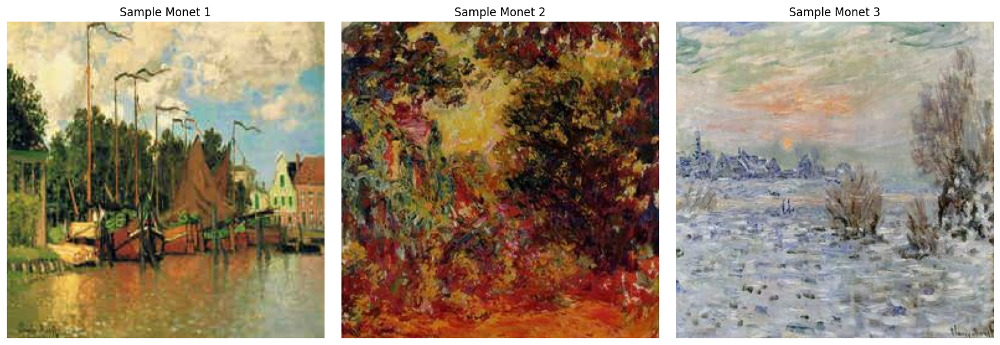

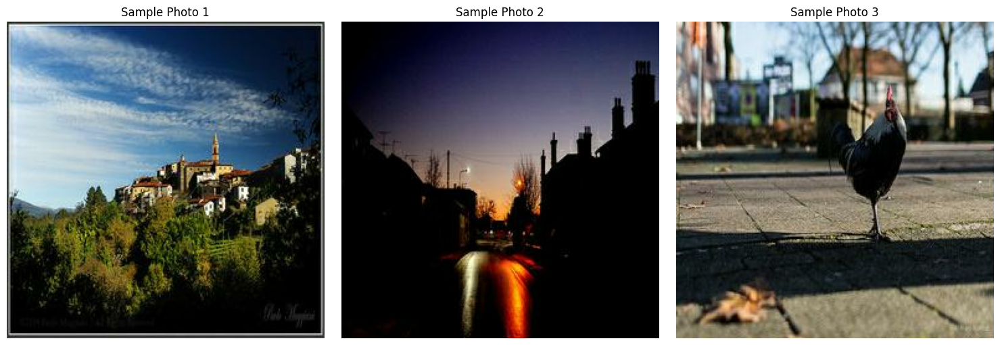


Setting up models...


Model summaries:
Monet Generator:


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │      9,408 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ instance_normaliza… │ (None, 256, 256,  │        128 │ conv2d[0][0]      │
│ (InstanceNormaliza… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu         │ (None, 256, 256,  │          0 │ instance_normali… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │     73,728 │ leaky_re_lu[0][0] │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ instance_normaliza… │ (None, 128, 128,  │        256 │ conv2d_1[0][0]    │
│ (InstanceNormaliza… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_1       │ (None, 128, 128,  │          0 │ instance_normali… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │    294,912 │ leaky_re_lu_1[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ instance_normaliza… │ (None, 64, 64,    │        512 │ conv2d_2[0][0]    │
│ (InstanceNormaliza… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_2       │ (None, 64, 64,    │          0 │ instance_normali… │
│ (LeakyReLU)         │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │    589,824 │ leaky_re_lu_2[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ instance_normaliza… │ (None, 64, 64,    │        512 │ conv2d_3[0][0]    │
│ (InstanceNormaliza… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_3       │ (None, 64, 64,    │          0 │ instance_normali… │
│ (LeakyReLU)         │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │    589,824 │ leaky_re_lu_3[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ instance_normaliza… │ (None, 64, 64,    │        512 │ conv2d_4[0][0]    │
│ (InstanceNormaliza… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 64, 64,    │          0 │ instance_normali… │
│                     │ 256)              │            │ leaky_re_lu_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │    589,824 │ add[0][0]       

 Total params: 11,383,427 (43.42 MB)

 Trainable params: 11,383,427 (43.42 MB)

 Non-trainable params: 0 (0.00 B)


Training model for 10 epochs with MiFID evaluation every 5 epochs...
Loaded InceptionV3 model for feature extraction


Epoch 1/10:   0%|          | 0/240 [00:00<?, ?it/s]

Epoch 1/10
  Batch 0/240: monet_gen: 15.4720, photo_gen: 15.0841, monet_disc: 1.0575, photo_disc: 1.2242
  Batch 10/240: monet_gen: 10.3715, photo_gen: 10.3800, monet_disc: 0.8082, photo_disc: 2.1894
  Batch 20/240: monet_gen: 10.7987, photo_gen: 9.5924, monet_disc: 1.3874, photo_disc: 0.4637
  Batch 30/240: monet_gen: 7.6000, photo_gen: 7.4891, monet_disc: 0.4098, photo_disc: 0.3844
  Batch 40/240: monet_gen: 7.6616, photo_gen: 7.9702, monet_disc: 0.3909, photo_disc: 0.6387
  Batch 50/240: monet_gen: 10.3833, photo_gen: 10.3899, monet_disc: 0.3297, photo_disc: 0.3654
  Batch 60/240: monet_gen: 9.5495, photo_gen: 9.7248, monet_disc: 0.4091, photo_disc: 0.4013
  Batch 70/240: monet_gen: 8.6106, photo_gen: 8.7497, monet_disc: 0.2857, photo_disc: 0.2710
  Batch 80/240: monet_gen: 7.0935, photo_gen: 7.1700, monet_disc: 0.3210, photo_disc: 0.3319
  Batch 90/240: monet_gen: 6.9763, photo_gen: 6.9122, monet_disc: 0.3275, photo_disc: 0.2838
  Batch 100/240: monet_gen: 6.8189, photo_gen: 6.7119

Epoch 1/10:   0%|          | 0/240 [1:12:55<?, ?it/s]


Epoch 2/10
  Batch 0/240: monet_gen: 5.7620, photo_gen: 5.8024, monet_disc: 0.2693, photo_disc: 0.2506
  Batch 10/240: monet_gen: 7.0588, photo_gen: 7.0841, monet_disc: 0.2320, photo_disc: 0.2344
  Batch 20/240: monet_gen: 5.9338, photo_gen: 5.9785, monet_disc: 0.2177, photo_disc: 0.2238
  Batch 30/240: monet_gen: 7.6341, photo_gen: 7.8343, monet_disc: 0.2547, photo_disc: 0.1922
  Batch 40/240: monet_gen: 6.7756, photo_gen: 6.8242, monet_disc: 0.2576, photo_disc: 0.1983
  Batch 50/240: monet_gen: 11.0913, photo_gen: 10.9262, monet_disc: 0.2762, photo_disc: 0.3515
  Batch 60/240: monet_gen: 7.7940, photo_gen: 7.5716, monet_disc: 0.3139, photo_disc: 0.3218
  Batch 70/240: monet_gen: 8.1276, photo_gen: 8.1917, monet_disc: 0.2722, photo_disc: 0.2195
  Batch 80/240: monet_gen: 5.6893, photo_gen: 5.7409, monet_disc: 0.4089, photo_disc: 0.2283
  Batch 90/240: monet_gen: 5.8702, photo_gen: 5.5254, monet_disc: 0.3110, photo_disc: 0.2298
  Batch 100/240: monet_gen: 6.2604, photo_gen: 6.4476, mon

Epoch 2/10:   0%|          | 0/240 [1:14:12<?, ?it/s]


Epoch 3/10
  Batch 0/240: monet_gen: 7.2881, photo_gen: 7.1039, monet_disc: 0.1612, photo_disc: 0.1848
  Batch 10/240: monet_gen: 8.8328, photo_gen: 8.6579, monet_disc: 0.2722, photo_disc: 0.2821
  Batch 20/240: monet_gen: 9.3435, photo_gen: 8.9561, monet_disc: 0.1524, photo_disc: 0.1678
  Batch 30/240: monet_gen: 9.9846, photo_gen: 10.0258, monet_disc: 0.1691, photo_disc: 0.1559
  Batch 40/240: monet_gen: 6.2367, photo_gen: 6.0073, monet_disc: 0.2752, photo_disc: 0.1949
  Batch 50/240: monet_gen: 6.7149, photo_gen: 6.5020, monet_disc: 0.3194, photo_disc: 0.2306
  Batch 60/240: monet_gen: 6.6526, photo_gen: 6.5880, monet_disc: 0.2322, photo_disc: 0.3014
  Batch 70/240: monet_gen: 6.3683, photo_gen: 6.2911, monet_disc: 0.2403, photo_disc: 0.2252
  Batch 80/240: monet_gen: 5.7635, photo_gen: 5.6412, monet_disc: 0.2200, photo_disc: 0.4615
  Batch 90/240: monet_gen: 5.9230, photo_gen: 6.3549, monet_disc: 0.3183, photo_disc: 0.4746
  Batch 100/240: monet_gen: 7.8874, photo_gen: 7.9778, mone

Epoch 3/10:   0%|          | 0/240 [1:16:00<?, ?it/s]


Epoch 4/10
  Batch 0/240: monet_gen: 7.6149, photo_gen: 7.5076, monet_disc: 0.1348, photo_disc: 0.1740
  Batch 10/240: monet_gen: 4.9861, photo_gen: 4.6035, monet_disc: 0.4003, photo_disc: 0.2052
  Batch 20/240: monet_gen: 5.2256, photo_gen: 5.3728, monet_disc: 0.2437, photo_disc: 0.3535
  Batch 30/240: monet_gen: 6.7430, photo_gen: 7.0009, monet_disc: 0.3579, photo_disc: 0.1853
  Batch 40/240: monet_gen: 6.1128, photo_gen: 6.1514, monet_disc: 0.1589, photo_disc: 0.1744
  Batch 50/240: monet_gen: 7.0965, photo_gen: 6.8885, monet_disc: 0.1716, photo_disc: 0.1784
  Batch 60/240: monet_gen: 6.7090, photo_gen: 6.6729, monet_disc: 0.1685, photo_disc: 0.2434
  Batch 70/240: monet_gen: 8.6623, photo_gen: 8.8407, monet_disc: 0.1676, photo_disc: 0.2237
  Batch 80/240: monet_gen: 6.8526, photo_gen: 6.8448, monet_disc: 0.3757, photo_disc: 0.2986
  Batch 90/240: monet_gen: 11.6934, photo_gen: 11.3258, monet_disc: 0.1517, photo_disc: 0.2358
  Batch 100/240: monet_gen: 9.3660, photo_gen: 9.4809, mon

Epoch 4/10:   0%|          | 0/240 [1:12:07<?, ?it/s]


Epoch 5/10
  Batch 0/240: monet_gen: 6.8197, photo_gen: 7.1696, monet_disc: 0.3016, photo_disc: 0.4028
  Batch 10/240: monet_gen: 8.9253, photo_gen: 8.6759, monet_disc: 0.2222, photo_disc: 0.2775
  Batch 20/240: monet_gen: 8.5277, photo_gen: 7.7433, monet_disc: 0.6829, photo_disc: 0.1878
  Batch 30/240: monet_gen: 5.1255, photo_gen: 4.4415, monet_disc: 0.3194, photo_disc: 0.2131
  Batch 40/240: monet_gen: 8.2312, photo_gen: 7.5192, monet_disc: 0.3055, photo_disc: 0.2217
  Batch 50/240: monet_gen: 7.4939, photo_gen: 7.7104, monet_disc: 0.1828, photo_disc: 0.1808
  Batch 60/240: monet_gen: 8.4815, photo_gen: 8.6327, monet_disc: 0.1830, photo_disc: 0.2120
  Batch 70/240: monet_gen: 4.6721, photo_gen: 4.7877, monet_disc: 0.2311, photo_disc: 0.1968
  Batch 80/240: monet_gen: 8.8920, photo_gen: 9.3828, monet_disc: 0.2075, photo_disc: 0.2165
  Batch 90/240: monet_gen: 5.2826, photo_gen: 5.5952, monet_disc: 0.2025, photo_disc: 0.1993
  Batch 100/240: monet_gen: 9.3595, photo_gen: 9.4389, monet

Epoch 5/10:   0%|          | 0/240 [1:07:55<?, ?it/s]


Epoch 6/10
  Batch 0/240: monet_gen: 5.5806, photo_gen: 5.5910, monet_disc: 0.2351, photo_disc: 0.1206
  Batch 10/240: monet_gen: 4.4708, photo_gen: 4.6749, monet_disc: 0.2286, photo_disc: 0.2287
  Batch 20/240: monet_gen: 5.9189, photo_gen: 5.7391, monet_disc: 0.0927, photo_disc: 0.2386
  Batch 30/240: monet_gen: 6.4980, photo_gen: 6.7527, monet_disc: 0.1801, photo_disc: 0.5799
  Batch 40/240: monet_gen: 5.0983, photo_gen: 5.0061, monet_disc: 0.2254, photo_disc: 0.2664
  Batch 50/240: monet_gen: 9.2745, photo_gen: 9.4508, monet_disc: 0.1084, photo_disc: 0.2644
  Batch 60/240: monet_gen: 4.5064, photo_gen: 4.5632, monet_disc: 0.3116, photo_disc: 0.1808
  Batch 70/240: monet_gen: 4.8198, photo_gen: 4.6055, monet_disc: 0.1256, photo_disc: 0.1931
  Batch 80/240: monet_gen: 5.5546, photo_gen: 5.5572, monet_disc: 0.2959, photo_disc: 0.1906
  Batch 90/240: monet_gen: 4.9722, photo_gen: 4.8803, monet_disc: 0.1511, photo_disc: 0.2361
  Batch 100/240: monet_gen: 5.6027, photo_gen: 5.5553, monet

Epoch 6/10:   0%|          | 0/240 [1:05:09<?, ?it/s]


Epoch 7/10
  Batch 0/240: monet_gen: 6.3696, photo_gen: 5.9241, monet_disc: 0.1564, photo_disc: 0.3548
  Batch 10/240: monet_gen: 4.3963, photo_gen: 4.7530, monet_disc: 0.1804, photo_disc: 0.3492
  Batch 20/240: monet_gen: 4.4545, photo_gen: 4.4345, monet_disc: 0.1321, photo_disc: 0.1268
  Batch 30/240: monet_gen: 5.8433, photo_gen: 5.7768, monet_disc: 0.1069, photo_disc: 0.2814
  Batch 40/240: monet_gen: 5.1374, photo_gen: 4.8376, monet_disc: 0.3635, photo_disc: 0.3181
  Batch 50/240: monet_gen: 4.8047, photo_gen: 5.0118, monet_disc: 0.1757, photo_disc: 0.2011
  Batch 60/240: monet_gen: 3.9671, photo_gen: 4.4900, monet_disc: 0.2249, photo_disc: 0.1819
  Batch 70/240: monet_gen: 5.5902, photo_gen: 5.5827, monet_disc: 0.2292, photo_disc: 0.1806
  Batch 80/240: monet_gen: 4.4098, photo_gen: 4.1871, monet_disc: 0.2634, photo_disc: 0.2307
  Batch 90/240: monet_gen: 5.7844, photo_gen: 5.5907, monet_disc: 0.2702, photo_disc: 0.3246
  Batch 100/240: monet_gen: 6.1222, photo_gen: 6.2249, monet

Epoch 7/10:   0%|          | 0/240 [1:04:58<?, ?it/s]


Epoch 8/10
  Batch 0/240: monet_gen: 6.4592, photo_gen: 5.8558, monet_disc: 0.0549, photo_disc: 0.1260
  Batch 10/240: monet_gen: 4.8890, photo_gen: 5.0599, monet_disc: 0.2216, photo_disc: 0.2106
  Batch 20/240: monet_gen: 5.4566, photo_gen: 5.4943, monet_disc: 0.1364, photo_disc: 0.2258
  Batch 30/240: monet_gen: 8.1966, photo_gen: 8.1079, monet_disc: 0.1362, photo_disc: 0.1789
  Batch 40/240: monet_gen: 5.2884, photo_gen: 5.3234, monet_disc: 0.2047, photo_disc: 0.1311
  Batch 50/240: monet_gen: 7.0245, photo_gen: 7.4090, monet_disc: 0.3100, photo_disc: 0.1718
  Batch 60/240: monet_gen: 8.1286, photo_gen: 8.0536, monet_disc: 0.0898, photo_disc: 0.1120
  Batch 70/240: monet_gen: 7.1838, photo_gen: 7.4572, monet_disc: 0.1022, photo_disc: 0.0556
  Batch 80/240: monet_gen: 5.8631, photo_gen: 5.6841, monet_disc: 0.1025, photo_disc: 0.1266
  Batch 90/240: monet_gen: 5.9126, photo_gen: 5.4669, monet_disc: 0.1802, photo_disc: 0.3204
  Batch 100/240: monet_gen: 4.8821, photo_gen: 5.0722, monet

Epoch 8/10:   0%|          | 0/240 [1:04:55<?, ?it/s]


Epoch 9/10
  Batch 0/240: monet_gen: 5.5797, photo_gen: 5.2494, monet_disc: 0.2746, photo_disc: 0.2191
  Batch 10/240: monet_gen: 5.0394, photo_gen: 4.6427, monet_disc: 0.1903, photo_disc: 0.1742
  Batch 20/240: monet_gen: 5.4098, photo_gen: 5.7718, monet_disc: 0.2519, photo_disc: 0.1854
  Batch 30/240: monet_gen: 6.7027, photo_gen: 6.4738, monet_disc: 0.2205, photo_disc: 0.2044
  Batch 40/240: monet_gen: 4.5203, photo_gen: 4.5977, monet_disc: 0.2252, photo_disc: 0.1327
  Batch 50/240: monet_gen: 6.2904, photo_gen: 6.7922, monet_disc: 0.2963, photo_disc: 0.1964
  Batch 60/240: monet_gen: 5.3512, photo_gen: 5.3743, monet_disc: 0.2093, photo_disc: 0.3200
  Batch 70/240: monet_gen: 5.2855, photo_gen: 5.4726, monet_disc: 0.1025, photo_disc: 0.2002
  Batch 80/240: monet_gen: 4.3520, photo_gen: 3.9361, monet_disc: 0.2368, photo_disc: 0.2732
  Batch 90/240: monet_gen: 6.3254, photo_gen: 6.3110, monet_disc: 0.1719, photo_disc: 0.1292
  Batch 100/240: monet_gen: 5.5374, photo_gen: 5.2135, monet

Epoch 9/10:   0%|          | 0/240 [1:04:57<?, ?it/s]


Epoch 10/10
  Batch 0/240: monet_gen: 4.6047, photo_gen: 4.9649, monet_disc: 0.3035, photo_disc: 0.3547
  Batch 10/240: monet_gen: 4.8447, photo_gen: 4.9038, monet_disc: 0.1015, photo_disc: 0.1637
  Batch 20/240: monet_gen: 8.5584, photo_gen: 8.4426, monet_disc: 0.1503, photo_disc: 0.1954
  Batch 30/240: monet_gen: 8.0801, photo_gen: 8.1746, monet_disc: 0.1144, photo_disc: 0.0859
  Batch 40/240: monet_gen: 6.2754, photo_gen: 6.1319, monet_disc: 0.2544, photo_disc: 0.1598
  Batch 50/240: monet_gen: 6.1566, photo_gen: 5.9255, monet_disc: 0.1057, photo_disc: 0.2051
  Batch 60/240: monet_gen: 5.9169, photo_gen: 5.9405, monet_disc: 0.3210, photo_disc: 0.1148
  Batch 70/240: monet_gen: 5.6252, photo_gen: 5.4262, monet_disc: 0.4061, photo_disc: 0.1975
  Batch 80/240: monet_gen: 5.0907, photo_gen: 5.5580, monet_disc: 0.2682, photo_disc: 0.1521
  Batch 90/240: monet_gen: 4.5156, photo_gen: 4.9784, monet_disc: 0.1520, photo_disc: 0.3732
  Batch 100/240: monet_gen: 5.9501, photo_gen: 5.4884, mone

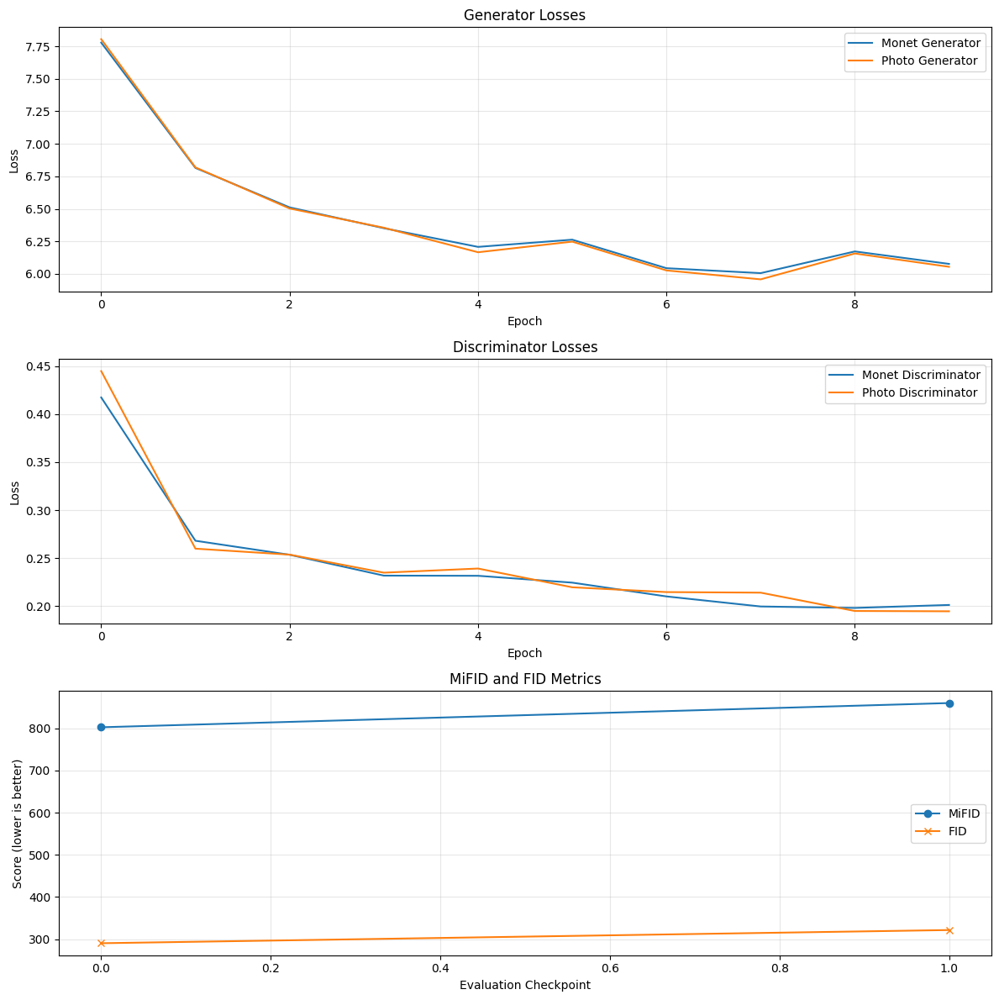

Epoch 10/10:   0%|          | 0/240 [1:06:23<?, ?it/s]



Generating Monet-style images from photos...
Generated images 1 to 4
Generated images 5 to 8
Generated images 9 to 12
Generated images 13 to 16
Generated images 17 to 20
Generated images 21 to 24
Generated images 25 to 28
Generated images 29 to 32
Generated images 33 to 36
Generated images 37 to 40
Generated images 41 to 44
Generated images 45 to 48
Generated images 49 to 52
Generated images 53 to 56
Generated images 57 to 60
Generated images 61 to 64
Generated images 65 to 68
Generated images 69 to 72
Generated images 73 to 76
Generated images 77 to 80
Generated images 81 to 84
Generated images 85 to 88
Generated images 89 to 92
Generated images 93 to 96
Generated images 97 to 100
Generated images 101 to 104
Generated images 105 to 108
Generated images 109 to 112
Generated images 113 to 116
Generated images 117 to 120
Generated images 121 to 124
Generated images 125 to 128
Generated images 129 to 132
Generated images 133 to 136
Generated images 137 to 140
Generated images 141 to 144


In [38]:
strategy = tf.distribute.get_strategy()

# Create datasets with train/validation split
print("\nCreating datasets with train/validation split...")
monet_train_ds, monet_val_ds = create_train_val_splits(
    MONET_DIR, train_split=0.8, augment=True)

photo_train_ds, photo_val_ds = create_train_val_splits(
    PHOTO_DIR, train_split=0.8, augment=False)

if monet_train_ds is None or photo_train_ds is None:
    print("Failed to create datasets. Please check the directory paths.")
else:
    # Create paired datasets for training and validation
    print("\nCreating paired datasets...")
    train_dataset, train_steps = create_paired_dataset(monet_train_ds, photo_train_ds)
    val_dataset, val_steps = create_paired_dataset(monet_val_ds, photo_val_ds)
    
    # Sample images for visualization
    print("\nSampling images for visualization...")
    sample_monet, sample_photo = sample_from_datasets(monet_val_ds, photo_val_ds, n_samples=3)
    
    print("\nShowing sample images...")
    # Display sample Monet paintings
    plt.figure(figsize=(15, 5))
    for i in range(len(sample_monet)):
        plt.subplot(1, 3, i + 1)
        plt.imshow((sample_monet[i] + 1) / 2)
        plt.title(f"Sample Monet {i+1}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    # Display sample photos
    plt.figure(figsize=(15, 5))
    for i in range(len(sample_photo)):
        plt.subplot(1, 3, i + 1)
        plt.imshow((sample_photo[i] + 1) / 2)
        plt.title(f"Sample Photo {i+1}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    # Set up models and optimizers within the strategy scope
    print("\nSetting up models...")
    with strategy.scope():
        # Create generator and discriminator models
        monet_generator = get_resnet_generator()
        photo_generator = get_resnet_generator()
        monet_discriminator = get_discriminator()
        photo_discriminator = get_discriminator()
        
        # Setup optimizers
        generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
        discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
        
        # Create and compile CycleGAN model
        cycle_gan_model = CycleGAN(
            monet_generator, 
            photo_generator, 
            monet_discriminator, 
            photo_discriminator
        )
        
        cycle_gan_model.compile(
            m_gen_optimizer=generator_optimizer,
            p_gen_optimizer=generator_optimizer,
            m_disc_optimizer=discriminator_optimizer,
            p_disc_optimizer=discriminator_optimizer,
            gen_loss_fn=generator_loss,
            disc_loss_fn=discriminator_loss,
            cycle_loss_fn=calc_cycle_loss,
            identity_loss_fn=identity_loss
        )
    
    # Print model summaries
    print("\nModel summaries:")
    print("Monet Generator:")
    monet_generator.summary()
    
    # Set default parameters for training (no interactive prompts)
    epochs = 10  # Set default number of epochs
    mifid_freq = 5  # Set default MiFID evaluation frequency
    
    # Train the model with MiFID evaluation
    print(f"\nTraining model for {epochs} epochs with MiFID evaluation every {mifid_freq} epochs...")
    loss_history, mifid_history = train_cyclegan_with_mifid(
        cycle_gan_model,
        train_dataset,
        val_dataset,
        epochs=epochs,
        steps_per_epoch=train_steps,
        save_dir=CHECKPOINT_DIR,
        sample_monet=sample_monet,
        sample_photo=sample_photo,
        save_freq=1,
        mifid_freq=mifid_freq
    )
    
    # Generate Monet-style images automatically
    print("\nGenerating Monet-style images from photos...")
    generate_monet_images(monet_generator, PHOTO_DIR, OUTPUT_DIR)
    print(f"Images generated and saved to {OUTPUT_DIR}")